# Predicting Highly Rated Board Games

## Overview

In this project, our goal is to develop predictive models to determine whether a board game is likely to receive a high rating on BoardGameGeek.com. This will be achieved in several stages.

1. **Data Collection:** Scraping and collecting data from BoardGameGeek.com
2. **Data Preprocessing:** Processing numerical and categorical data
3. **Data Inspection and Visualizations:** Analyse outputs and plot dimensionally reduced pairplots
4. **Model Training:** Train linear and neural network models, analysing several metrics.
5. **Using Models to Generate Games:** Generated characteristics of games that the models predict to be highly rated.
6. **Conclusions:** Summarize the findings.

## 1. Data Collection

### Description

In this initial phase, we will gather information by scraping the BoardGameGeek website. The dataset will encompass details on approximately 25,000 board games, including factors such as game mechanics, categories, complexity, and playtime.

We obtain data by sending requests to the [BoardGameGeek API](https://api.geekdo.com/xmlapi/boardgame/224517&stats=1). Each request is processed using BeautifulSoup with an HTML parser, allowing us to extract the following information:

Identifying Features:
- Game ID
- Title of Game

Target Values:
- Rating of Game
- Votes for Rating (game must have sufficient votes to be included)

Numerical Data:
- Complexity
- Minimum Age
- Minimum Players
- Maximum Players
- Play Time

Categorical Data:
- Domain of Game
- Category of Game
- Mechanics of Game

These features provide a comprehensive dataset for our predictive modeling of board game ratings. For more information on what the meaning of the feature names, see:

- Domains: https://boardgamegeek.com/browse/boardgamesubdomain
- Categories: https://boardgamegeek.com/browse/boardgamecategory
- Mechancics: https://boardgamegeek.com/browse/boardgamemechanic

In [1]:
from bs4 import BeautifulSoup
import requests
import pandas as pd
import numpy as np
import random
import tensorflow as tf

## Set the random seed for reproducibility
np.random.seed(200)
random.seed(200)
tf.random.set_seed(200)


### Steps

1. **Define Functions:** Define functions that extract the information we are interested in.
2. **Iterate over Game IDs:** Run a loop over all Game IDs to obtain data for all games. Save that data in a DataFrame
3. **Train/Test Split:** Split the data into train and testing data sets.

### Define Functions

We define functions to extract all the relevant data from the BeautifulSoup.

Note that not all ID numbers are used for a game leading to a blank soup. Therefore, exceptions are included to counter this.

Further exceptions are made in the cases that we have partial missing data.

In [2]:
def get_rating(soup):
    try:
        rating = float(soup.find('rank').get('bayesaverage'))
        return rating
    except Exception as e:
        return None

def get_title(soup):
    try:
        title =  soup.find('name', attrs={'primary': 'true'}).text
        if title=='': return None
        else: return title
    except Exception as e:
        return None

def get_votes(soup):
    try:
        votes = soup.find('ratings').find('usersrated').text
        if votes=='': return None
        else: return votes
    except Exception as e:
        return None

def get_complexity(soup):
    try:
        complexity = soup.find('ratings').find('averageweight').text
        if complexity=='': return None
        else: return complexity
    except Exception as e:
        return None

def get_min_age(soup):
    try:
        age = soup.find('age').text
        if age == '': return None
        else: return age
    except Exception as e:
        return None

def get_min_players(soup):
    try:
        min_players = soup.find('minplayers').text
        if min_players=='': return None
        else: return min_players
    except Exception as e:
        return None
    
def get_max_players(soup):
    try:
        max_players = soup.find('maxplayers').text
        if max_players == '': return None
        else: return max_players
    except Exception as e:
        return None

def get_play_time(soup):
    try:
        play_time = soup.find('playingtime').text
        if play_time == '': return None
        else: return play_time
    except Exception as e:
        return None

## For the categorical data of Domains, Categories and Mechanics, we append a (D),(C) and (M) to the end of the string for ease of distinguishing
## the three types of categorical data.
## Moreover, in the case that there is no data, we return a placeholder value of Uncategorized.

def get_subdomains(soup):
    try:
        subdomains = [x.text + '(D)' for x in soup.find_all('boardgamesubdomain')]
        if subdomains == []:
            return ['Uncategorized(D)']
        if 'Expansion for Base-game(D)' in subdomains:
            return None
        return subdomains
    except Exception as e:
        return None

def get_categories(soup):
    try:
        categories = [category.text + '(C)' for category in soup.find_all('boardgamecategory')]
        if categories == []:
            return ['Uncategorized(C)']
        if 'Expansion for Base-game(C)' in categories:
            return None
        return categories
    except Exception as e:
        return None

def get_mechanics(soup):
    try:
        mechanics = [mechanic.text+'(M)' for mechanic in soup.find_all('boardgamemechanic')]
        if mechanics == []:
            return ['Uncategorized(M)']
        if 'Expansion for Base-game(M)' in mechanics:
            return None
        return mechanics
    except Exception as e:
        return None

### Iterate over Game IDs

Define a function that will iterate over all game IDs in a range and output a dataframe with the relevant data.

In [3]:
def get_game_data(min_game_id , max_game_id):

    ## Initialize the DataFrame with the column names

    cols = ['Rating', 'Title', 'Game ID', 'Votes', 'Complexity', 'Minimum Age',
       'Minimum Players', 'Max Players', 'Play Time', 'Subdomain',
       'Categories', 'Mechanics']

    df = pd.DataFrame(columns = cols)

    for game_id in range(min_game_id,max_game_id+1):

        ## Get the page request for the relevant game ID and create the BeautifulSoup with the html parser.
        url = 'https://api.geekdo.com/xmlapi/boardgame/' + str(game_id) + '&stats=1'
        page = requests.get(url)
        soup = BeautifulSoup(page.text, 'html.parser')

        ## Apply all the functions from the previous cell to get the data from the BeautifulSoup
        ## If one of the functions hits an exception and returns a value of None, skip the game ID.

        rating = get_rating(soup)
        if rating == None: continue

        title = get_title(soup)
        if title==None: continue

        votes = get_votes(soup)
        if votes==None: continue

        complexity = get_complexity(soup)
        if complexity==None: continue

        min_age = get_min_age(soup)
        if min_age==None: continue

        min_players = get_min_players(soup)
        if min_players==None: continue

        max_players = get_max_players(soup)
        if max_players==None: continue

        play_time = get_play_time(soup)
        if play_time==None: continue

        subdomain = get_subdomains(soup)
        if subdomain==None: continue

        categories = get_categories(soup)
        if categories==None: continue

        mechanics = get_mechanics(soup)
        if mechanics==None: continue


        ## If there is no information for Domain, Category and Mechanics, skip the game ID.
        if subdomain==['Uncategorized(D)'] and categories==['Uncategorized(C)'] and mechanics==['Uncategorized(M)']: continue

        ## Create a new row and append it to the end of the DataFrame. 

        new_row = {'Rating':rating, 'Title':title, 'Game ID':game_id, 'Votes':votes, 'Complexity':complexity, 'Minimum Age':min_age,
       'Minimum Players':min_players, 'Max Players':max_players, 'Play Time':play_time, 'Subdomain':subdomain,
       'Categories':categories, 'Mechanics':mechanics}
        
        df.loc[len(df)] = new_row

    return df

Test and visualize the DataFrame generated by extracting the data from games with game ID between 1 and 10.

In [4]:
df_raw = get_game_data(1,10)

To extract the data for all the games, we now have to iterate over all game IDs between 1 and 400,000.

However, this process can take a very long time so we leave that code commented out and, instead, read in a pre-made csv file

In [5]:
## df_raw = get_game_data(1,400000)

df_raw = pd.read_csv('Data/RawData.csv')

df_raw

,Rating,Title,Game ID,Votes,Complexity,Minimum Age,Minimum Players,Max Players,Play Time,Subdomain,Categories,Mechanics
0,7.05283,Die Macher,1,5693,4.3153,14,3,5,240,['Strategy Games(D)'],"['Economic(C)', 'Negotiation(C)', 'Political(C)']","['Alliances(M)', 'Area Majority / Influence(M)..."
1,5.76001,Dragonmaster,2,587,1.9636,12,3,4,30,['Strategy Games(D)'],"['Card Game(C)', 'Fantasy(C)']",['Trick-taking(M)']
2,7.22650,Samurai,3,16026,2.4771,10,2,4,60,['Strategy Games(D)'],"['Abstract Strategy(C)', 'Medieval(C)']","['Area Majority / Influence(M)', 'Hand Managem..."
3,5.66403,Tal der Könige,4,354,2.6667,12,2,4,60,['Strategy Games(D)'],['Ancient(C)'],"['Action Points(M)', 'Area Majority / Influenc..."
4,7.12290,Acquire,5,19820,2.5000,12,2,6,90,['Strategy Games(D)'],"['Economic(C)', 'Territory Building(C)']","['Hand Management(M)', 'Investment(M)', 'Marke..."
...,...,...,...,...,...,...,...,...,...,...,...,...
24948,5.53859,Shadows of Brimstone: Lost Tombs of Khamuntet,394218,47,3.0000,12,1,4,120,['Uncategorized(D)'],"['Adventure(C)', 'Exploration(C)', 'Fantasy(C)...","['Cooperative Game(M)', 'Dice Rolling(M)', 'Gr..."
24949,5.53867,Sunrise Lane,394334,46,1.7500,8,2,4,45,['Uncategorized(D)'],"['Card Game(C)', 'City Building(C)']",['Uncategorized(M)']
24950,5.53926,Penny Black,394961,43,1.6667,10,2,4,20,['Uncategorized(D)'],['Uncategorized(C)'],"['End Game Bonuses(M)', 'Grid Coverage(M)', 'O..."
24951,5.63571,Nucleum,396790,114,4.0357,14,1,4,150,['Uncategorized(D)'],"['Economic(C)', 'Industry / Manufacturing(C)',...","['Action Retrieval(M)', 'Connections(M)', 'Con..."


### Train/Test Split

Before preprocessing, we form the train and test data sets.

As there are about 25000 games, we shuffle the DataFrame and keep the first 20000 as the train data.

The last 5000 games are the test data for a 80/20 train-test split.

In [6]:
df_raw = df_raw.sample(frac=1).reset_index(drop=True)

df_raw_train = df_raw.iloc[:20000].copy()
df_raw_test = df_raw.iloc[20000:].copy()

## 2. Data Preprocessing

### Description

Now that the data is collected and we have formed train and test data we may process the train data and perform the same operations on the test data. 

In [7]:
import matplotlib.pyplot as plt

### Steps

1. **Vote Relevance:** Keep only those games that have had enough votes to ensure the rating is statiscally valid.
2. **Numerical Data Cleaning:** Inspect the numerical data for outliers and missing data, removing or filling in data where relevant.
3. **Categorical Data Numerization:** One-hot encode the categorical data.
4. **Numerical Data Normalization:** Normalize the numerical data to all be on the same 0 - 1 scale.

### Vote Relevance

Check how many votes the least voted game in the training set has.

In [8]:
print('The minimum number of votes a game received in the training set is: ', np.min(df_raw_train['Votes']))

The minimum number of votes a game received in the training set is:  30


As 30 votes seems a sufficiently large number of votes to have confidence in the validity
of the rating, we leave all training games.

In [9]:
print('The minimum number of votes a game received in the test set is: ', np.min(df_raw_test['Votes']))

The minimum number of votes a game received in the test set is:  30


As the minimum number of voted in the test set is also 30, we need not remove any here either.

### Numerical Data Cleaning

We now move on to cleaning the numerical data by inspecting their values and removing or filling in missing data.

#### Complexity

We visualize the complexity by plotting it against the rating.

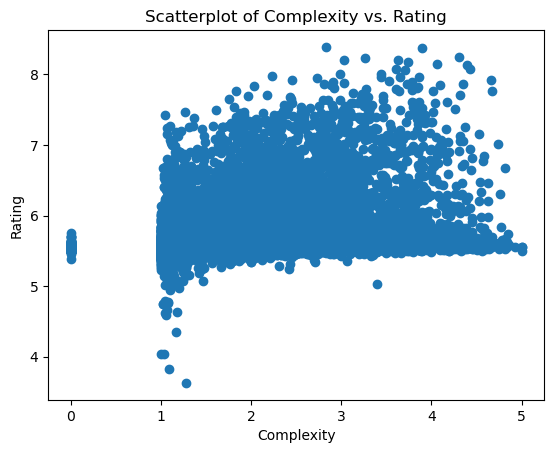

In [10]:
plt.scatter(df_raw_train['Complexity'], df_raw_train['Rating'])
plt.xlabel('Complexity')
plt.ylabel('Rating')
plt.title('Scatterplot of Complexity vs. Rating')
plt.show()

We see that there seems to be slight positive correlation between Complexity and the Rating but nothing too conclusive.

However, we do see that there are some outliers that have a complexity of 0, while the rest at least have a complexity of 1.

In [11]:
print('The number of training games with 0 complexity is:', len(df_raw_train[df_raw_train['Complexity']==0]))

The number of training games with 0 complexity is: 481


A complexity of 0 results from no BoardGameGeek community members suggesting a complexity. Since there are relatively few games that have 0 Complexity, it should not affect our results to simply drop them in the trainging and test sets.

In [12]:
df_raw_train = df_raw_train[df_raw_train['Complexity']>0]

print('The number of training games with 0 complexity is:', len(df_raw_test[df_raw_test['Complexity']==0]))

df_raw_test = df_raw_test[df_raw_test['Complexity']>0]

The number of training games with 0 complexity is: 128


#### Minimum Age

To visualize where the minimum ages of a games lie, we plot a histogram of the minimum ages.

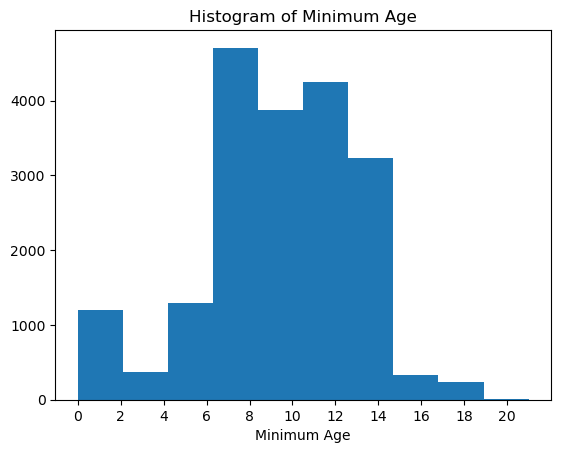

In [13]:
plt.hist(df_raw_train['Minimum Age'], bins = 10)
plt.xlabel('Minimum Age')
plt.title('Histogram of Minimum Age')
plt.xticks(range(0, int(df_raw_train['Minimum Age'].max()) + 1, 2))
plt.show()

Most games have a minimum age around 8 - 14, which is not unexpected.

There is a spike around the ages 0-3, likely due to the games that do not have a minimum age.

A few games have a minimum age between 18 and 21, likely due to games involving mature content and/or alcohol.

Overall this data looks fine and no cleaning seems necessary.

#### Min/Max Players

Plot a scatter plot of Min vs Max Players.

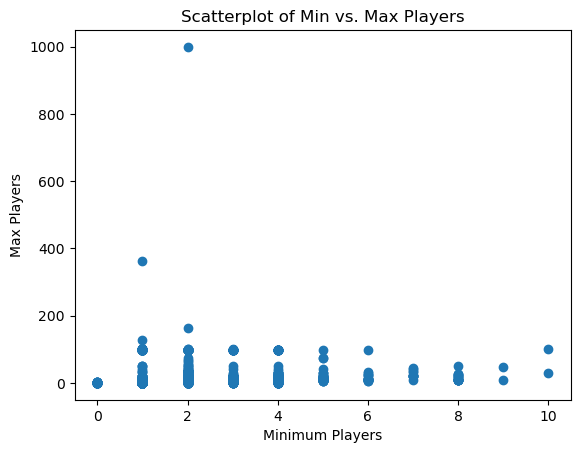

In [14]:
plt.scatter(df_raw_train['Minimum Players'], df_raw_train['Max Players'])
plt.xlabel('Minimum Players')
plt.ylabel('Max Players')
plt.title('Scatterplot of Min vs. Max Players')
plt.show()

We see that there are some games with extremely high maximum players. This is due to the games not having a cap on the number of people who can play (like Bingo).

In [15]:
print('The number of player with strictly more than 10 players is', len(df_raw_train[df_raw_train['Max Players']>10]))

The number of player with strictly more than 10 players is 686


Since relatively few games have strictly more than 10 players, to avoid skewing the data, we set the maximum number of Max Players to be 10. Further since every game needs at least one player, we set the number of minimum players equal to 1 in the case that the number of minimim players is 0.

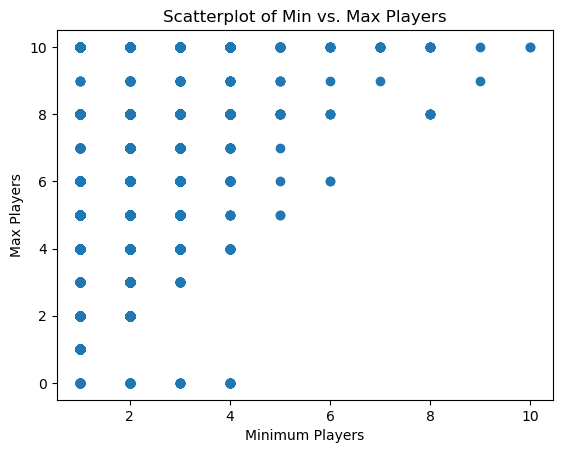

In [16]:
df_raw_train.loc[df_raw_train['Max Players'] >10, 'Max Players'] = 10
df_raw_train.loc[df_raw_train['Minimum Players'] ==0, 'Minimum Players'] = 1
plt.scatter(df_raw_train['Minimum Players'], df_raw_train['Max Players'])
plt.xlabel('Minimum Players')
plt.ylabel('Max Players')
plt.title('Scatterplot of Min vs. Max Players')
plt.show()

The plot is much easier to read and we notice that most of the time we have the maximum number of players is larger than the minimum number of players (as it should be). However, for some games we see that the maximum number of players is 0, likely due to missing data. Hence we will set the maximum number of players equal to the minimum number of players in this case.

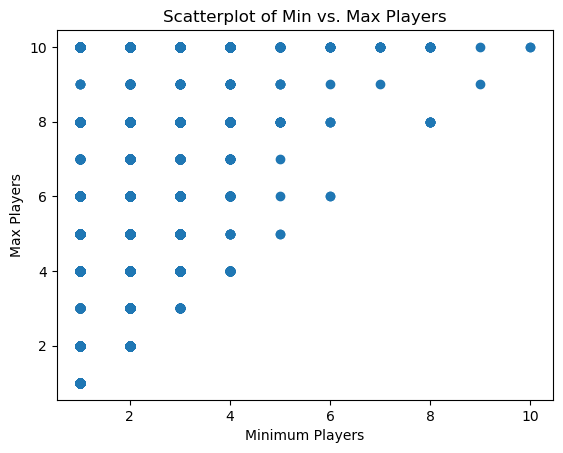

In [17]:
df_raw_train.loc[df_raw_train['Max Players'] < df_raw_train['Minimum Players'], 'Max Players'] = df_raw_train['Minimum Players']
plt.scatter(df_raw_train['Minimum Players'], df_raw_train['Max Players'])
plt.xlabel('Minimum Players')
plt.ylabel('Max Players')
plt.title('Scatterplot of Min vs. Max Players')
plt.show()

We now perform the same transformations on the test data.

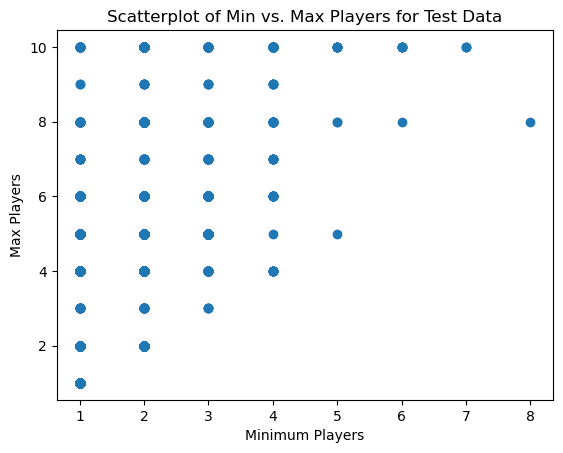

In [18]:
df_raw_test.loc[df_raw_test['Max Players'] >10, 'Max Players'] = 10
df_raw_test.loc[df_raw_test['Minimum Players'] ==0, 'Minimum Players'] = 1
df_raw_test.loc[df_raw_test['Max Players'] < df_raw_test['Minimum Players'], 'Max Players'] = df_raw_test['Minimum Players']
plt.scatter(df_raw_test['Minimum Players'], df_raw_test['Max Players'])
plt.xlabel('Minimum Players')
plt.ylabel('Max Players')
plt.title('Scatterplot of Min vs. Max Players for Test Data')
plt.show()

#### Play Time

We first check the game that has the longest play time.

In [19]:
max_play_time = np.max(df_raw_train['Play Time'])
longest_game = df_raw_train[df_raw_train['Play Time'] == max_play_time]['Title'].iloc[0]

print(longest_game, 'is the game with the longest play time of', max_play_time, 'minutes.')

print('The number of games with a play time of greater than 180 minutes is', len(df_raw_train[df_raw_train['Play Time'] >180 ]))

The Campaign for North Africa: The Desert War 1940-43 is the game with the longest play time of 60000 minutes.
The number of games with a play time of greater than 180 minutes is 1260


There are very few games with play times greater than 3 hours and of those, some have extraordinarily high play times. Therefore, we will put a cap of 3 hours for our play time.

In [20]:
df_raw_train.loc[df_raw_train['Play Time'] >180, 'Play Time'] = 180

As well as games whose recorded times may be too high to be reasonable, some games have a recorded time of 0. As there are not many, we will set their play times equal to the most common play time.

In [21]:
print('The number of games with 0 recored play time is', len(df_raw_train[df_raw_train['Play Time'] ==0 ]))

df_raw_train.loc[df_raw_train['Play Time'] == 0, 'Play Time'] = df_raw_train[df_raw_train['Play Time']>0]['Play Time'].mode()[0]

The number of games with 0 recored play time is 641


Now, we plot a histogram to get a visualization of the play time.

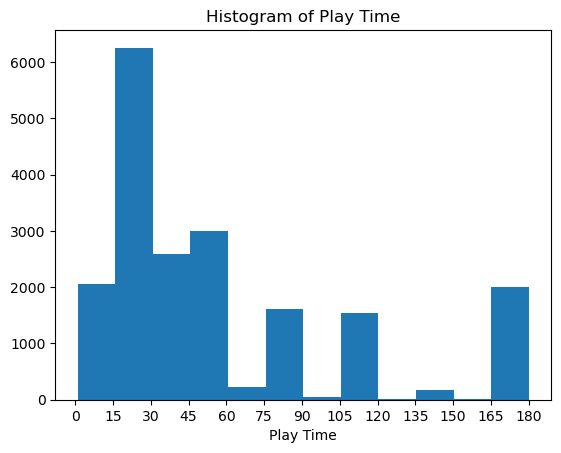

In [22]:
plt.hist(df_raw_train['Play Time'], bins = 12)
plt.xlabel('Play Time')
plt.title('Histogram of Play Time')
plt.xticks(range(0, int(df_raw_train['Play Time'].max()) + 1, 15))
plt.show()

Most games have play times between 15 and 60 mintes, which seems reasonable. 

Now we do the same transformations for the test data.

In [23]:
df_raw_test.loc[df_raw_test['Play Time'] >180, 'Play Time'] = 180

## Note, we set the missing test Play Time data to be the mode of the training Play Time data to avoid data leakage.
df_raw_test.loc[df_raw_test['Play Time'] == 0, 'Play Time'] = df_raw_train[df_raw_train['Play Time']>0]['Play Time'].mode()[0]

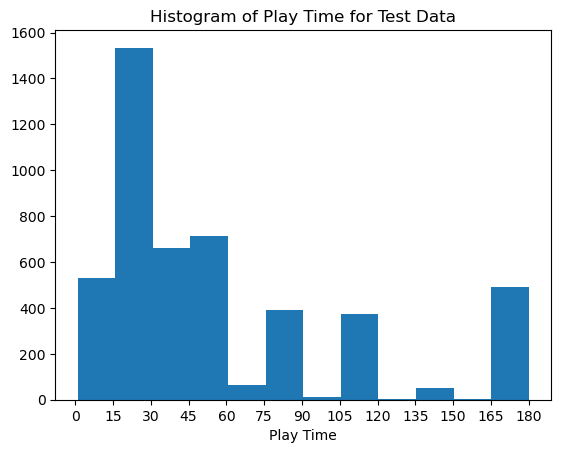

In [24]:
plt.hist(df_raw_test['Play Time'], bins = 12)
plt.xlabel('Play Time')
plt.title('Histogram of Play Time for Test Data')
plt.xticks(range(0, int(df_raw_train['Play Time'].max()) + 1, 15))
plt.show()

We now save the new dataframes under new names.

#### Renaming DataFrames

Now that we have analyzed and cleaned the numerical data, we will drop the Votes and Game ID columns as they are now longer necessary. Moreover, to avoid complications in the future, we will rename the DataFrames.

In [25]:
df_clean_train = df_raw_train.drop(columns = ['Votes','Game ID'])
df_clean_test = df_raw_test.drop(columns = ['Votes','Game ID'])

### Categorical Data Numerization

We have several forms of categorical data in terms of Subdomain, Categories and Mechanics of the games. We numerize these first by one-hot enoding them.

In [26]:
## Import the MultiLabelBinarizer

from sklearn.preprocessing import MultiLabelBinarizer

When we scrape BoardGameGeek, we save the entries in the Subdomain, Categories and Mehanics columns as lists. However, since we have instead read the DataFrame from a csv file, the entries are strings and so we must first convert them back into lists.

In [27]:
## THIS CELL MAY BE SKIPPED IF THE COMPLETE WEBSCRAPING HAS BEEN RUN

df_clean_train['Subdomain'] = df_clean_train['Subdomain'].str.strip("[]").str.replace("'","").str.split(", ")
df_clean_train['Categories'] = df_clean_train['Categories'].str.strip("[]").str.replace("'","").str.split(", ")
df_clean_train['Mechanics'] = df_clean_train['Mechanics'].str.strip("[]").str.replace("'","").str.split(", ")

In [28]:
## Define and fit MultiLabelBinarizers to the Subdomain, Categories and Mechanics columns of the train data.

mlb_subdomain = MultiLabelBinarizer()
mlb_subdomain.fit(df_clean_train['Subdomain'])

mlb_category = MultiLabelBinarizer()
mlb_category.fit(df_clean_train['Categories'])

mlb_mechanics = MultiLabelBinarizer()
mlb_mechanics.fit(df_clean_train['Mechanics'])

## Transform the Subdomain, Categories and Mechanics columns into DataFrames

train_subdomain_columns = pd.DataFrame(mlb_subdomain.transform(df_clean_train['Subdomain']), columns=mlb_subdomain.classes_, index=df_clean_train.index)
train_category_columns = pd.DataFrame(mlb_category.transform(df_clean_train['Categories']), columns=mlb_category.classes_, index=df_clean_train.index)
train_mechanics_columns = pd.DataFrame(mlb_mechanics.transform(df_clean_train['Mechanics']), columns=mlb_mechanics.classes_, index=df_clean_train.index)


## Append the new columns to the old DataFrame

df_clean_train = pd.concat([df_clean_train, train_subdomain_columns, train_category_columns,train_mechanics_columns], axis=1)

## Drop the old columns

df_clean_train.drop(columns = ['Subdomain','Categories','Mechanics'], inplace=True)



Inspecting the new columns, we see that the transition from the strings to the lists was not perfect as some of the features have commas in their names for which the split function separated. Namely these are:

 - Deck, Bag, and Pool Building(M)
 - I Cut, You Choose(M)
 - Worker Placement, Different Worker Types(M)

We fix these by renaming one of the columns and dropping the rest.

In [29]:
## THIS CELL MAY BE SKIPPED IF THE COMPLETE WEBSCRAPING HAS BEEN RUN

df_clean_train.rename(columns = {'Deck': 'Deck, Bag, and Pool Building(M)', 'I Cut':'I Cut, You Choose(M)', 'Worker Placement' : 'Worker Placement, Different Worker Types(M)'}, inplace = True)
df_clean_train.drop(['Bag', 'and Pool Building(M)', 'You Choose(M)', 'Different Worker Types(M)'], axis=1, inplace = True)

Finally, we notice that some features have quotation marks on them. For tidiness, we remove them from the feature names.

In [30]:
df_clean_train.rename(columns={'"Childrens Games(D)"': 'Childrens Games(D)', '"Childrens Game(C)"': 'Childrens Game(C)', '"Prisoners Dilemma(M)"' : 'Prisoners Dillema(M)'}, inplace=True)

We now do the same thing with the test DataFrame.

In [31]:
## THIS CELL MAY BE SKIPPED IF THE COMPLETE WEBSCRAPING HAS BEEN RUN
## Conert the string entries into lists

df_clean_test['Subdomain'] = df_clean_test['Subdomain'].str.strip("[]").str.replace("'","").str.split(", ")
df_clean_test['Categories'] = df_clean_test['Categories'].str.strip("[]").str.replace("'","").str.split(", ")
df_clean_test['Mechanics'] = df_clean_test['Mechanics'].str.strip("[]").str.replace("'","").str.split(", ")

In [32]:
## Transform the Subdomain, Categories and Mechanics columns into DataFrames using the MultiLabelClassifier fit on the training data to avoid data leakage.

test_subdomain_columns = pd.DataFrame(mlb_subdomain.transform(df_clean_test['Subdomain']), columns=mlb_subdomain.classes_, index=df_clean_test.index)
test_category_columns = pd.DataFrame(mlb_category.transform(df_clean_test['Categories']), columns=mlb_category.classes_, index=df_clean_test.index)
test_mechanics_columns = pd.DataFrame(mlb_mechanics.transform(df_clean_test['Mechanics']), columns=mlb_mechanics.classes_, index=df_clean_test.index)


## Append the new columns to the old DataFrame

df_clean_test = pd.concat([df_clean_test, test_subdomain_columns, test_category_columns,test_mechanics_columns], axis=1)

## Drop the old columns

df_clean_test.drop(columns = ['Subdomain','Categories','Mechanics'], inplace=True)

## Tidy the names of the columns

df_clean_test.rename(columns={'"Childrens Games(D)"': 'Childrens Games(D)', '"Childrens Game(C)"': 'Childrens Game(C)', '"Prisoners Dilemma(M)"' : 'Prisoners Dillema(M)'}, inplace=True)


In [33]:
## THIS CELL MAY BE SKIPPED IF THE COMPLETE WEBSCRAPING HAS BEEN RUN
## Fix the errors in the list formation encoding

df_clean_test.rename(columns = {'Deck': 'Deck, Bag, and Pool Building(M)', 'I Cut':'I Cut, You Choose(M)', 'Worker Placement' : 'Worker Placement, Different Worker Types(M)'}, inplace = True)
df_clean_test.drop(['Bag', 'and Pool Building(M)', 'You Choose(M)', 'Different Worker Types(M)'], axis=1, inplace = True)

#### Renaming DataFrames

Again, out of caution, we rename the DataFrames and print them out for visible ispection.

In [34]:
df_OHE_train = df_clean_train
df_OHE_train.head()

,Rating,Title,Complexity,Minimum Age,Minimum Players,Max Players,Play Time,Childrens Games(D),Abstract Games(D),Customizable Games(D),...,Uncategorized(M),Variable Phase Order(M),Variable Player Powers(M),Variable Set-up(M),Victory Points as a Resource(M),Voting(M),"Worker Placement, Different Worker Types(M)",Worker Placement with Dice Workers(M),Worker Placement(M),Zone of Control(M)
0,5.62051,Flix Mix,1.1154,6,2,4,20,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,5.56147,Rey Paparajote,2.1429,10,3,5,45,0,0,0,...,0,0,1,0,0,0,0,0,0,0
2,5.55323,Vorpals,2.0000,12,2,5,30,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,5.52728,Giant Monster Rampage,2.0000,12,2,2,60,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,5.51486,Harry Hopper,1.0000,6,2,4,20,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [35]:
df_OHE_test = df_clean_test
df_OHE_test.head()

,Rating,Title,Complexity,Minimum Age,Minimum Players,Max Players,Play Time,Childrens Games(D),Abstract Games(D),Customizable Games(D),...,Uncategorized(M),Variable Phase Order(M),Variable Player Powers(M),Variable Set-up(M),Victory Points as a Resource(M),Voting(M),"Worker Placement, Different Worker Types(M)",Worker Placement with Dice Workers(M),Worker Placement(M),Zone of Control(M)
20000,6.91714,Escape Plan,3.6690,12,1,5,120,0,0,0,...,0,0,0,0,0,0,0,0,0,0
20001,5.60942,Le Passe-Trappe Grande,1.0000,10,2,2,5,0,0,0,...,1,0,0,0,0,0,0,0,0,0
20002,5.59286,Atlantic Wall: The Invasion of Europe June 1944,3.9615,12,2,2,180,0,0,0,...,0,0,0,0,0,0,0,0,0,1
20003,6.74339,Crystal Palace,3.8056,14,2,5,150,0,0,0,...,0,0,0,0,0,0,0,1,0,0
20004,5.68016,Picnic,1.1667,8,1,9,15,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Numerical Data Normalization

We now normalize our data by scaling it to be on the same 0 - 1 scale.

#### Min-max Scaling

For the features of Complexity, Minimum Age, Minimum Players, Max Players and Play Time as well as the output feature of Rating, we will apply min-max scaling.

In [36]:
## Obtain the min and max of each of the numerical features and the output

max_rating = np.max(df_OHE_train['Rating'])
max_complexity = np.max(df_OHE_train['Complexity'])
max_min_age = np.max(df_OHE_train['Minimum Age'])
max_min_players = np.max(df_OHE_train['Minimum Players'])
max_max_players = np.max(df_OHE_train['Max Players'])
max_play_time = np.max(df_OHE_train['Play Time'])

min_rating = np.min(df_OHE_train['Rating'])
min_complexity = np.min(df_OHE_train['Complexity'])
min_min_age = np.min(df_OHE_train['Minimum Age'])
min_min_players = np.min(df_OHE_train['Minimum Players'])
min_max_players = np.min(df_OHE_train['Max Players'])
min_play_time = np.min(df_OHE_train['Play Time'])

## Subtract by the minimum values and divide by the range between the max and min values

df_OHE_train['Rating'] = (df_OHE_train['Rating'] - min_rating) / (max_rating - min_rating)
df_OHE_train['Complexity'] = (df_OHE_train['Complexity'] - min_complexity) / (max_complexity - min_complexity)
df_OHE_train['Minimum Age'] = (df_OHE_train['Minimum Age'] - min_min_age) / (max_min_age - min_min_age)
df_OHE_train['Minimum Players'] = (df_OHE_train['Minimum Players'] - min_min_players) / (max_min_players - min_min_players)
df_OHE_train['Max Players'] = (df_OHE_train['Max Players'] - min_max_players) / (max_max_players - min_max_players)
df_OHE_train['Play Time'] = (df_OHE_train['Play Time'] - min_play_time) / (max_play_time - min_play_time)


Do the same min-max scaling for the test data but using the mins and maxes of the training set to avoid data leakage.

In [37]:
df_OHE_test['Rating'] = (df_OHE_test['Rating'] - min_rating) / (max_rating - min_rating)
df_OHE_test['Complexity'] = (df_OHE_test['Complexity'] - min_complexity) / (max_complexity - min_complexity)
df_OHE_test['Minimum Age'] = (df_OHE_test['Minimum Age'] - min_min_age) / (max_min_age - min_min_age)
df_OHE_test['Minimum Players'] = (df_OHE_test['Minimum Players'] - min_min_players) / (max_min_players - min_min_players)
df_OHE_test['Max Players'] = (df_OHE_test['Max Players'] - min_max_players) / (max_max_players - min_max_players)
df_OHE_test['Play Time'] = (df_OHE_test['Play Time'] - min_play_time) / (max_play_time - min_play_time)

#### Probabilize the One-Hot Encoding

Previously, we one-hot encoded the categorical data. However, we wish to view these as probabilistic values. For example a game with only two mechanics should have this reflected in the numbers being 0.5 each.

In [38]:
## Obtain the columns of DataFrame as well as the subsets corresponding to Subdomain, Categories, Mechanics

cols = df_OHE_test.columns
subdomain_cols = cols[7:16]
category_cols = cols[16:100]
mechanic_cols = cols[100:]

## For each of the subsets, divide each row by the sum of the columns

df_OHE_train[subdomain_cols] = df_OHE_train[subdomain_cols].div(df_OHE_train[subdomain_cols].sum(axis=1), axis=0)
df_OHE_train[category_cols] = df_OHE_train[category_cols].div(df_OHE_train[category_cols].sum(axis=1), axis=0)
df_OHE_train[mechanic_cols] = df_OHE_train[mechanic_cols].div(df_OHE_train[mechanic_cols].sum(axis=1), axis=0)


Since by design a game was Uncategorized if and only if it had no feature of that type, those games will still always have just a 1 in the Uncategorized column with 0s everywhere else. Hence, the Uncategorized columns become redundant and we may drop them.

In [39]:
df_OHE_train.drop(columns = ['Uncategorized(D)','Uncategorized(M)','Uncategorized(C)'], inplace=True)

Perform the same transformations on the test data set.

In [40]:
## For each of the subsets, divide each row by the sum of the columns

df_OHE_test[subdomain_cols] = df_OHE_test[subdomain_cols].div(df_OHE_test[subdomain_cols].sum(axis=1), axis=0)
df_OHE_test[category_cols] = df_OHE_test[category_cols].div(df_OHE_test[category_cols].sum(axis=1), axis=0)
df_OHE_test[mechanic_cols] = df_OHE_test[mechanic_cols].div(df_OHE_test[mechanic_cols].sum(axis=1), axis=0)

## Drop the unneccessary 'Uncategorized' columns

df_OHE_test.drop(columns = ['Uncategorized(D)','Uncategorized(M)','Uncategorized(C)'], inplace=True)

### Rename the DataFrames

Now that our data is fully processed, we set the final name for the training and test DataFrames and visually inspect them.

In [41]:
df_train = df_OHE_train.reset_index(drop=True)

df_train.head()

,Rating,Title,Complexity,Minimum Age,Minimum Players,Max Players,Play Time,Childrens Games(D),Abstract Games(D),Customizable Games(D),...,Turn Order: Time Track(M),Variable Phase Order(M),Variable Player Powers(M),Variable Set-up(M),Victory Points as a Resource(M),Voting(M),"Worker Placement, Different Worker Types(M)",Worker Placement with Dice Workers(M),Worker Placement(M),Zone of Control(M)
0,0.418446,Flix Mix,0.028850,0.285714,0.111111,0.333333,0.106145,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.406041,Rey Paparajote,0.285725,0.476190,0.222222,0.444444,0.245810,0.0,0.0,0.0,...,0.0,0.0,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.404310,Vorpals,0.250000,0.571429,0.111111,0.444444,0.162011,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.398858,Giant Monster Rampage,0.250000,0.571429,0.111111,0.111111,0.329609,0.0,0.0,0.0,...,0.0,0.0,0.50,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.396248,Harry Hopper,0.000000,0.285714,0.111111,0.333333,0.106145,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [42]:
df_test = df_OHE_test.reset_index(drop=True)

df_test.head()

,Rating,Title,Complexity,Minimum Age,Minimum Players,Max Players,Play Time,Childrens Games(D),Abstract Games(D),Customizable Games(D),...,Turn Order: Time Track(M),Variable Phase Order(M),Variable Player Powers(M),Variable Set-up(M),Victory Points as a Resource(M),Voting(M),"Worker Placement, Different Worker Types(M)",Worker Placement with Dice Workers(M),Worker Placement(M),Zone of Control(M)
0,0.690880,Escape Plan,0.667250,0.571429,0.000000,0.444444,0.664804,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0
1,0.416116,Le Passe-Trappe Grande,0.000000,0.476190,0.111111,0.111111,0.022346,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0
2,0.412637,Atlantic Wall: The Invasion of Europe June 1944,0.740375,0.571429,0.111111,0.111111,1.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.2
3,0.654373,Crystal Palace,0.701400,0.666667,0.111111,0.444444,0.832402,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.125,0.0,0.0
4,0.430979,Picnic,0.041675,0.380952,0.000000,0.888889,0.078212,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0


## 3. Data Inspection and Visualizations

### Description

In this section, we examine various forms of the data. We will analyse the distribution of the outputs (ratings) as well as reduce the dimensionality of the training data use Non-Negative Matrix Factorization (NMF). Pairplots will be generated to visualize the dimensionally reduced data.

In [43]:
from sklearn.decomposition import NMF
from scipy.optimize import nnls
from scipy.optimize import minimize
import seaborn as sns

### Steps

1. **Analyse outputs:** Plot histograms of various transformations of the output data.
2. **Dimensionality Reduction:** Use NMF models to reduce the dimensions and form pairplots.
3. **Dimensionality Reduction of Partial Features:** Use NMF models on the subsets of the data corresponding to Subdomian,Categories, etc.

### Analyse Outputs

Plot a histrogram of the training data.

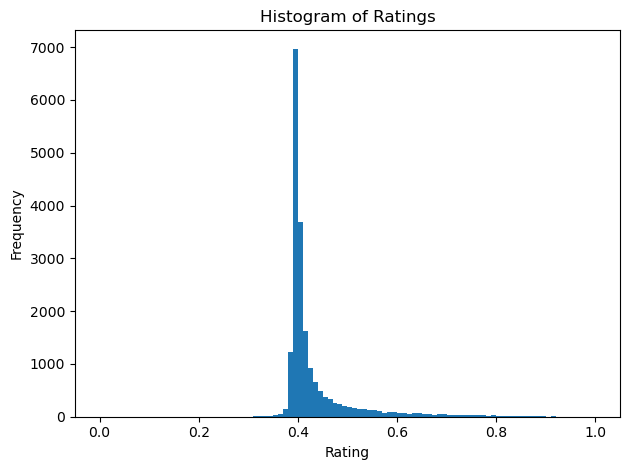

Bin with the most elements: [0.39 0.4 ]
Median of ratings: 0.40223639755937673


In [44]:
## Name the ratings of the training data y_train
y_train = df_train['Rating']

## Plot the histogram of the ratings
hist_values, bin_edges, _ = plt.hist(y_train,bins=100)
plt.title('Histogram of Ratings')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

## Find the bin with the most elements
max_bin_index = np.argmax(hist_values)
max_bin_edges = bin_edges[max_bin_index:max_bin_index + 2]

print('Bin with the most elements:', max_bin_edges)

## Find the median of the ratings
median = y_train.sort_values().median()
print('Median of ratings:', median)

We see that the majority of the outputs are between 0.39 and 0.4, with relatively few games higher or lower. Therefore, it may be difficult to fit a model that accurately predicts highly rated games. Therefore, we will transform the ratings using various sigmoid transformations to identify what may have the best opportunities.

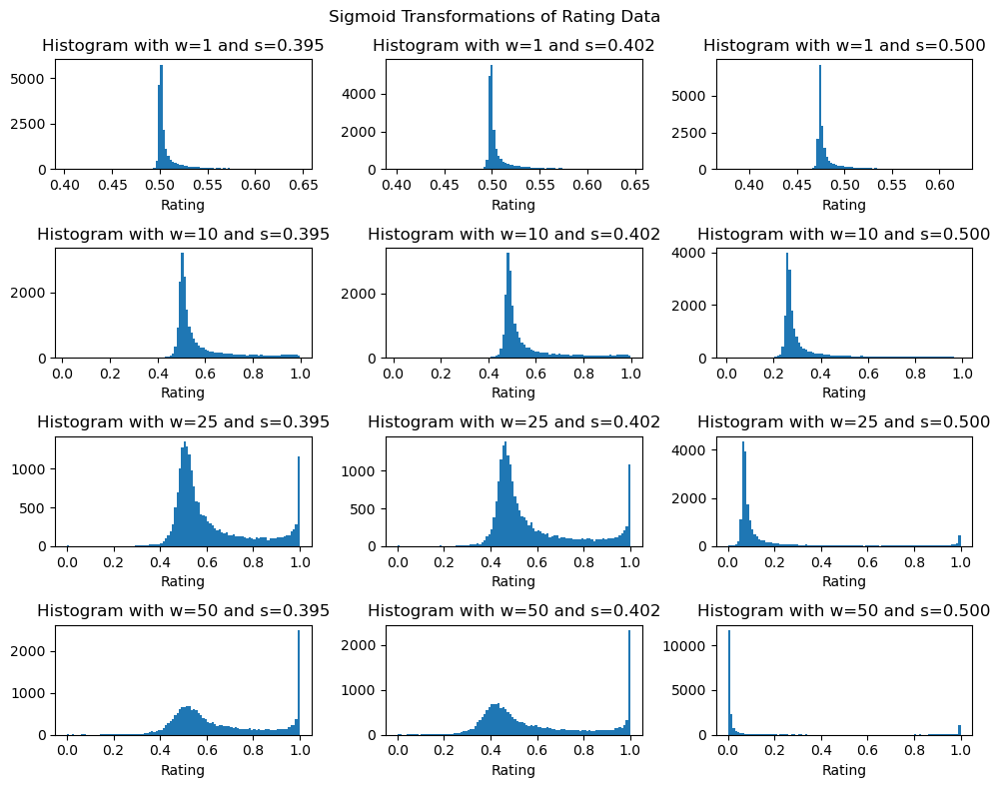

In [45]:
## Define the sigmoid function with weight w and shift s
def sigmoid(x, w=1, s=0.5):
    return 1 / (1 + np.exp(-w * (x - s)))

## Find the average 
max_bin_average = (bin_edges[max_bin_index] + bin_edges[max_bin_index+1])/2

## Create the subplots
fig, axs = plt.subplots(4, 3, figsize=(10, 8))

## Loop over relevant weights and shifts of the data
for s_idx, s in enumerate([max_bin_average,median,0.5]):
    for w_idx,w in enumerate([1,10,25,50]):
        ## Initialize the appropriate axis
        ax = axs[w_idx,s_idx]

        ## Transform the data with the corresponding simoid transformation and plot the histogram
        ax.hist(sigmoid(y_train,w,s), bins=100)

        ## Add titles and labels
        ax.set_title('Histogram with w='+str(w)+' and s={:.3f}'.format(s))
        ax.set_xlabel('Rating')
        ax.set_ylabel('')

     
## Add title to the whole graph and show it
plt.suptitle('Sigmoid Transformations of Rating Data')
plt.tight_layout()
plt.show()


Thus we see that with a weight of 25 or 50 and a shift equal to the median or maximum bin average, we shift sufficient data to the positive end so that it will make our models easier predict those values.

### Dimensionality Reduction

#### NMF Model

Here, we will fit a NMF model to our training data and use it to investigate the shape of our data.

In [46]:
## Create the NMF model
NMF_model = NMF(n_components = 9, max_iter =1000)

## Name the columns and get the training feature data
cols = df_train.columns
X_train = df_train[cols[2:]]

## Fit and tranform the model on X_train
NMF_X_train = pd.DataFrame(NMF_model.fit_transform(X_train))

## Inspect the new DataFrame
NMF_X_train

,0,1,2,3,4,5,6,7,8
0,0.007915,0.000000,0.000000,0.147680,0.008647,0.067557,0.000000,0.002652,0.000000
1,0.029200,0.000000,0.004898,0.000883,0.002911,0.043426,0.079006,0.000000,0.003022
2,0.019099,0.000000,0.004178,0.001691,0.001006,0.119697,0.065754,0.000000,0.003423
3,0.006842,0.140630,0.000000,0.000000,0.001603,0.008232,0.016100,0.000000,0.088390
4,0.028096,0.000336,0.000302,0.001395,0.000812,0.002004,0.016077,0.049750,0.002763
...,...,...,...,...,...,...,...,...,...
19514,0.000722,0.000000,0.000577,0.154829,0.000000,0.006095,0.005931,0.003509,0.189206
19515,0.009270,0.000247,0.000276,0.001362,0.002119,0.003573,0.020648,0.049444,0.003870
19516,0.000000,0.015297,0.000000,0.000000,0.000000,0.000000,0.201585,0.000000,0.000000
19517,0.012978,0.000000,0.001297,0.004383,0.020884,0.000000,0.000000,0.198496,0.000000


#### Naming New Features

The columns are now the most 9 most relevant features and so we should inspect what they are.

In [47]:
## This functions takes in an non-negative integer, idx, and an NMF_model and outputs the vector in the original feature space corresponding to the (idx+1)-th basis vector in the NMF feature space.

def get_feature(idx, NMF_model):

    n=NMF_model.n_components_
    basis_vector = np.array([1 if i == idx else 0 for i in range(n)])

    return NMF_model.inverse_transform(basis_vector.reshape(1, -1))[0]

## Check which vector in the feature space becomes the 3rd most important features in the NMF space
get_feature(2,NMF_model)[:20]


array([2.04288304e+00, 1.95256407e+00, 3.50911671e-01, 1.11992325e+00,
       1.89037878e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 5.52725426e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 2.25912637e-02, 1.22262047e-03, 3.93509734e-04])

As we see, this is not so illuminating. Therefore, we will define a function that outputs the most significant arguments.

In [48]:
## Function that outputs the largest arguments whose sum surpasses a threshold times the total absolute sum
def get_sig_args(array, threshold):

    ## Comput the absolute value of tha array and the absolut sum
    abs_array = np.absolute(array)
    abs_total = array.sum()

    ## Obtain the arguments sorted such that their values are in descending order
    sorted_args = np.argsort(abs_array)[::-1]

    ## Initialize the output
    sig_args = np.array([],dtype=int)

    ## Iterated over the sorted arguments
    for arg in sorted_args:
        ## Append the current argument to the output
        sig_args = np.append(sig_args,arg)

        ## If the total absolute sum is greater than the threshold times the absolute sum, break the loop
        if abs_array[sig_args].sum() > (threshold*abs_total):
            break
    
    return sig_args


We now use this to plot a bar graph of the most significant arguments.

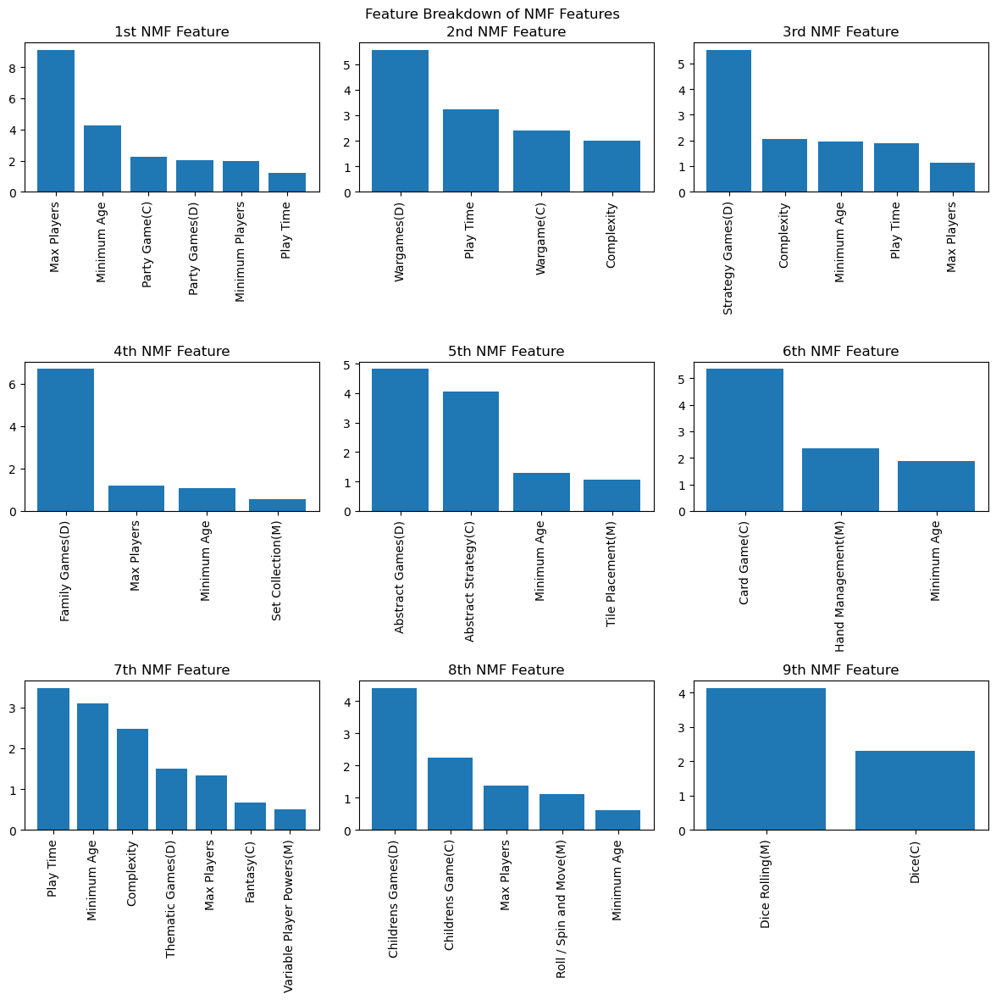

In [49]:
fig, axs = plt.subplots(3, 3, figsize=(12, 12))

for i in range(9):

    feature_vec = get_feature(i, NMF_model)
    sig_args = get_sig_args(feature_vec,0.6)

    ax = axs[i//3,i%3]
    x_ticks = np.arange(len(sig_args))  
    ax.bar(x_ticks, feature_vec[sig_args])
    ax.set_xticks(x_ticks)

    ## We must add 2 to sig_args as feature columns start at index 2.
    ax.set_xticklabels(cols[2+sig_args], rotation=90)
    if i+1 == 1:
        ax.set_title('1st NMF Feature')
    elif i+1 == 2:
        ax.set_title('2nd NMF Feature')
    elif i+1 == 3:
        ax.set_title('3rd NMF Feature')
    else:
        ax.set_title(str(i+1)+'th NMF Feature')

plt.suptitle('Feature Breakdown of NMF Features')
plt.tight_layout()
plt.show()

We can now visually inspect these graphs to see which of the original features are important for each of the new NMF features. We name the new features accordingly:

1. Party
2. War
3. Strategy
4. Family
5. Abstract
6. Card
7. Complex
8. Children
9. Dice

We rename the columns of NMF_X_train accordingly.

In [50]:
NMF_X_train.rename(columns = { 0: 'Party', 1 : 'War', 2 : 'Strategy', 3 : 'Family', 4 : 'Abstract', 5 : 'Card', 6 : 'Complex', 7 : 'Children', 8 : 'Dice' }, inplace=True)
NMF_X_train

,Party,War,Strategy,Family,Abstract,Card,Complex,Children,Dice
0,0.007915,0.000000,0.000000,0.147680,0.008647,0.067557,0.000000,0.002652,0.000000
1,0.029200,0.000000,0.004898,0.000883,0.002911,0.043426,0.079006,0.000000,0.003022
2,0.019099,0.000000,0.004178,0.001691,0.001006,0.119697,0.065754,0.000000,0.003423
3,0.006842,0.140630,0.000000,0.000000,0.001603,0.008232,0.016100,0.000000,0.088390
4,0.028096,0.000336,0.000302,0.001395,0.000812,0.002004,0.016077,0.049750,0.002763
...,...,...,...,...,...,...,...,...,...
19514,0.000722,0.000000,0.000577,0.154829,0.000000,0.006095,0.005931,0.003509,0.189206
19515,0.009270,0.000247,0.000276,0.001362,0.002119,0.003573,0.020648,0.049444,0.003870
19516,0.000000,0.015297,0.000000,0.000000,0.000000,0.000000,0.201585,0.000000,0.000000
19517,0.012978,0.000000,0.001297,0.004383,0.020884,0.000000,0.000000,0.198496,0.000000


#### Pairplot of NMF Features

Finally, we will plot a scatter pairplot in order to inspect how to games distribute with respect to these new featres. We will highlight the top and bottom ten percent of games to better understand how these features may affect the quality.

In [51]:
## Sort the ratings of train in ascending order
sorted_outputs = y_train.sort_values()

## Get the 1000th worst and best rating
low_boundary = sorted_outputs.iloc[1000]
high_boundary = sorted_outputs.iloc[-1001]

## Define the function that assigns 'Low' to anything in the lower 1000, 'High' to anything in the upper 1000 and 'Average' to everything else.
def assign_quality(rating):
    if rating <  low_boundary:
        return 'Low'
    elif  rating > high_boundary:
        return 'High'
    else:
        return 'Average'

## Create a new column in NMF_X_train called 'Quality'
NMF_X_train['Quality'] = y_train.apply(assign_quality)

## Inpsect the new DataFrame
NMF_X_train.head(11)

,Party,War,Strategy,Family,Abstract,Card,Complex,Children,Dice,Quality
0,0.007915,0.000000,0.000000,0.147680,0.008647,0.067557,0.000000,0.002652,0.000000,Average
1,0.029200,0.000000,0.004898,0.000883,0.002911,0.043426,0.079006,0.000000,0.003022,Average
2,0.019099,0.000000,0.004178,0.001691,0.001006,0.119697,0.065754,0.000000,0.003423,Average
3,0.006842,0.140630,0.000000,0.000000,0.001603,0.008232,0.016100,0.000000,0.088390,Average
4,0.028096,0.000336,0.000302,0.001395,0.000812,0.002004,0.016077,0.049750,0.002763,Average
5,0.009188,0.000000,0.000000,0.153743,0.000000,0.087131,0.000000,0.009199,0.000000,Average
6,0.021335,0.000000,0.005413,0.008761,0.003950,0.010138,0.045054,0.010512,0.104033,Average
7,0.010050,0.000000,0.004278,0.000000,0.004983,0.082326,0.111159,0.000000,0.003961,Average
8,0.012848,0.000000,0.006559,0.149686,0.000000,0.000000,0.024171,0.000000,0.000830,High
9,0.026098,0.000904,0.007280,0.002277,0.004573,0.038483,0.057540,0.000000,0.007090,Average


c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

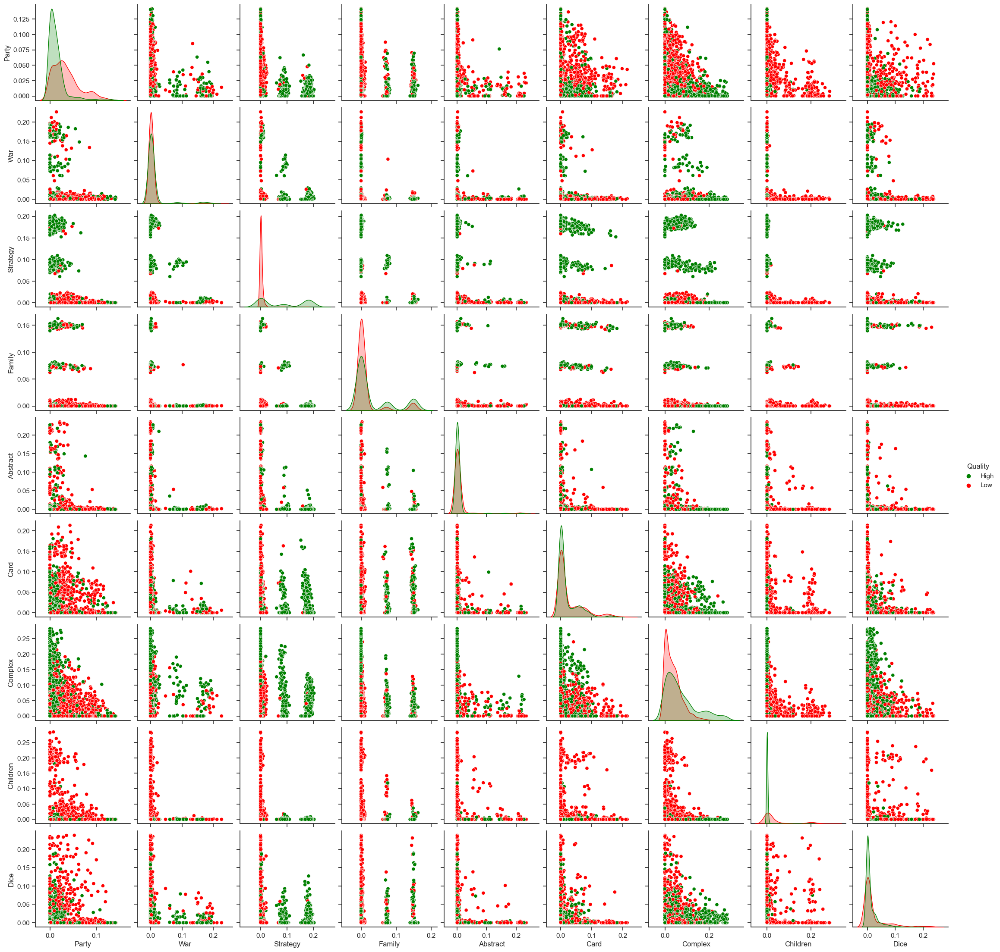

In [52]:
## For computational simplicity, we will only plot the games in the top and bottom 1000 and only the first four features
NMF_X_train_highlow = NMF_X_train[NMF_X_train['Quality'] != 'Average']

quality_palette = {'Low': 'red', 'High': 'green'}

sns.set(style="ticks")
scatterplot = sns.pairplot(NMF_X_train_highlow, hue='Quality', palette=quality_palette, hue_order = ['High','Low'])
plt.show()

Looking at the diagonals we can hypothesis that:
- Games with low Strategy or Complexity features tend to be low rated
- Games with low Party or Children features tend to be high rated
- Games with War or Cards have similar chances of being high or low rated.

Looking at the off-diagonal we can hypothesis that:
- Card and Dice games with low Strategy tend to be low rated
- Family games without Dice tend to be high rated

### Dimensionality Reduction of Partial Features

We now look at the same feature analysis but for the subset of features according to

- Attributes
- Subdomain 
- Categories
- Mechanics

#### Attributes

We call the columns consisting of 'Complexity', 'Minimum Age', 'Minimum Players', 'Max Players' and 'Play Time' the Attributes. As there only 5 such Attributes, we can skip the step of dimension reduction.

c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

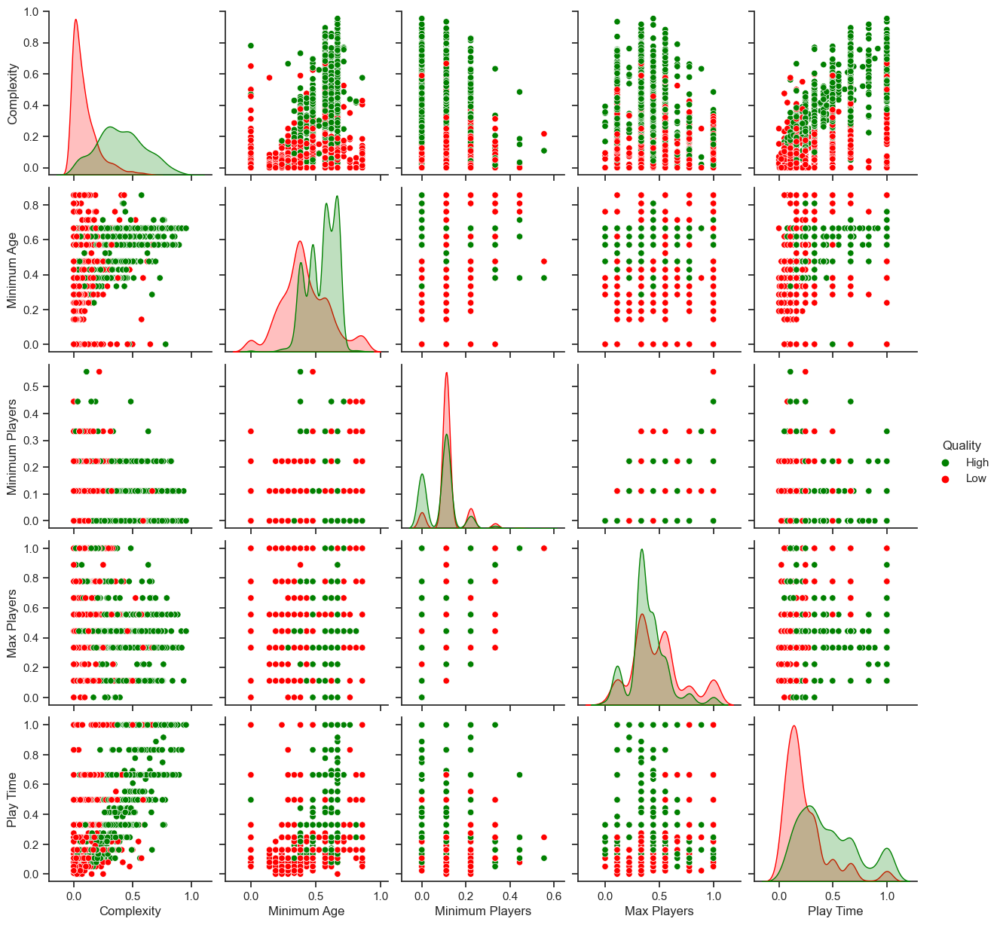

In [53]:
## Obtain and extract the columns correspind to the attributes
attribute_cols = cols[2:7]
X_train_attributes = X_train[attribute_cols].copy()

## Set the Quality of the games as before and extract only those with high and low quality
X_train_attributes['Quality'] = NMF_X_train['Quality']
X_train_attributes_highlow = X_train_attributes[X_train_attributes['Quality'] != 'Average']

## Plot the pairplots using the same quality paletter as before
sns.set(style="ticks")
attributes_scatterplot = sns.pairplot(X_train_attributes_highlow, hue='Quality', palette=quality_palette, hue_order = ['High','Low'])
plt.show()


This indicates that good game may be:

A LONG game with HIGH complexity for a FEW players that are NOT TOO young.

#### Subdomains

As with attributes, there are few enough Subdomains that we may skip the dimensionality reduction step.

c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

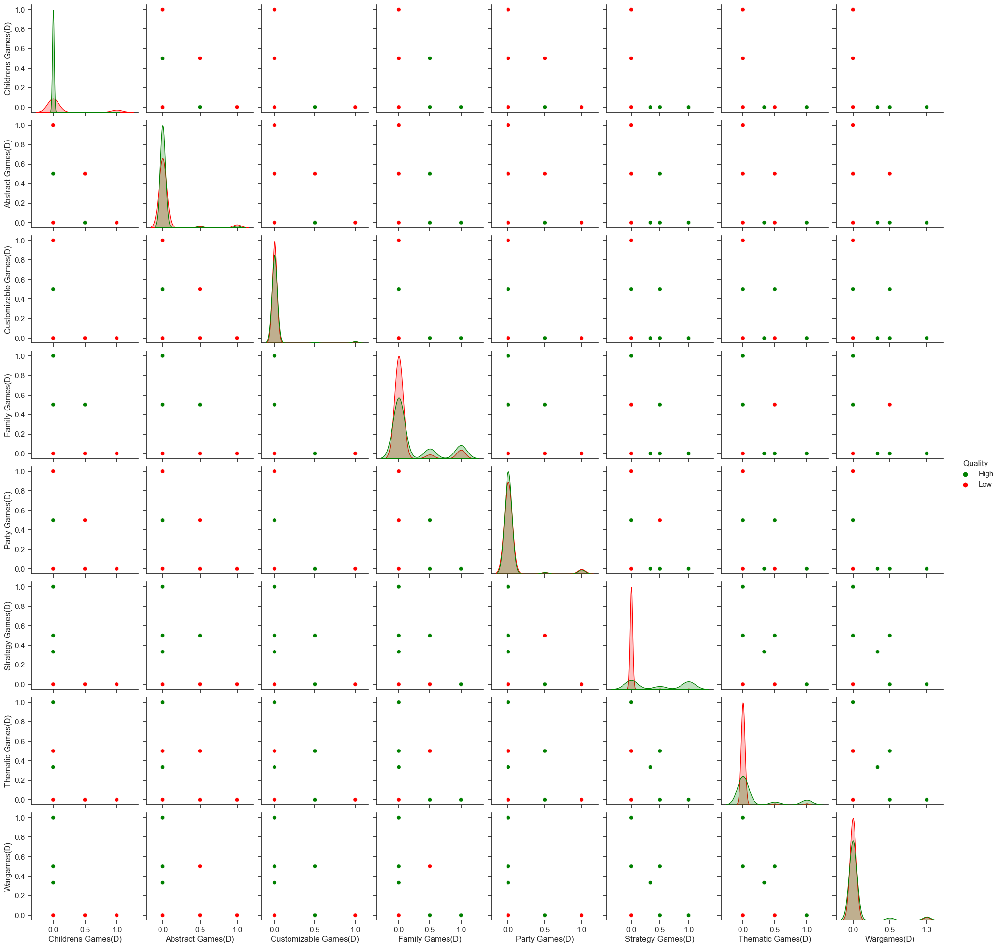

In [54]:
## Obtain and extract the columns correspind to the attributes
subdomain_cols = cols[7:15]
X_train_subdomain = X_train[subdomain_cols].copy()

## Set the Quality of the games as before and extract only those with high and low quality
X_train_subdomain['Quality'] = NMF_X_train['Quality']
X_train_subdomain_highlow = X_train_subdomain[X_train_subdomain['Quality'] != 'Average']

## Plot the pairplots using the same quality palette as before
sns.set(style="ticks")
subdomain_scatterplot = sns.pairplot(X_train_subdomain_highlow, hue='Quality', palette=quality_palette, hue_order = ['High','Low'])
plt.show()

By the sparseness of this data, the pairplot is not that enlightening. However, we can hypothesize that a good game would be a Thematic Strategy game NOT aimed at Children.

#### Categories

As there are multiple possible Categories, to plot we would need to reduce the dimension with an NMF model.

##### NMF Model

Define, fit and transform the NMF model on the cateogry features.

In [55]:
## Obtain and extract the columns correspind to the attributes
category_cols = cols[15:98]
X_train_categories = X_train[category_cols].copy()

## Create the NMF model
NMF_category_model = NMF(n_components = 9, max_iter =1000)

## Fit and tranform the model on X_train_categories
NMF_X_train_categories = pd.DataFrame(NMF_category_model.fit_transform(X_train_categories))


## Visually inspect the new DataFrame
NMF_X_train_categories


,0,1,2,3,4,5,6,7,8
0,0.076117,0.000000,0.000043,0.000813,0.004425,0.000000,0.003623,0.000000,0.001195
1,0.022381,0.000000,0.000000,0.000717,0.003942,0.036848,0.000764,0.004098,0.005510
2,0.074992,0.000000,0.000000,0.000000,0.000000,0.099169,0.000000,0.000000,0.000000
3,0.000046,0.041153,0.000000,0.000663,0.000000,0.007774,0.000000,0.000000,0.078815
4,0.000000,0.000000,0.000000,0.000000,0.003571,0.000000,0.147254,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...
19514,0.000000,0.000000,0.000000,0.159880,0.000000,0.000000,0.000000,0.000000,0.000000
19515,0.000000,0.000000,0.000000,0.000000,0.003571,0.000000,0.147254,0.000000,0.000000
19516,0.000963,0.002584,0.000233,0.000000,0.000547,0.000197,0.000000,0.006193,0.001601
19517,0.000806,0.000000,0.002206,0.001428,0.000000,0.000896,0.100437,0.000257,0.000000


##### Name the new NMF-Features

Perform the same analysis on the new NMF features to obtain relevant names.

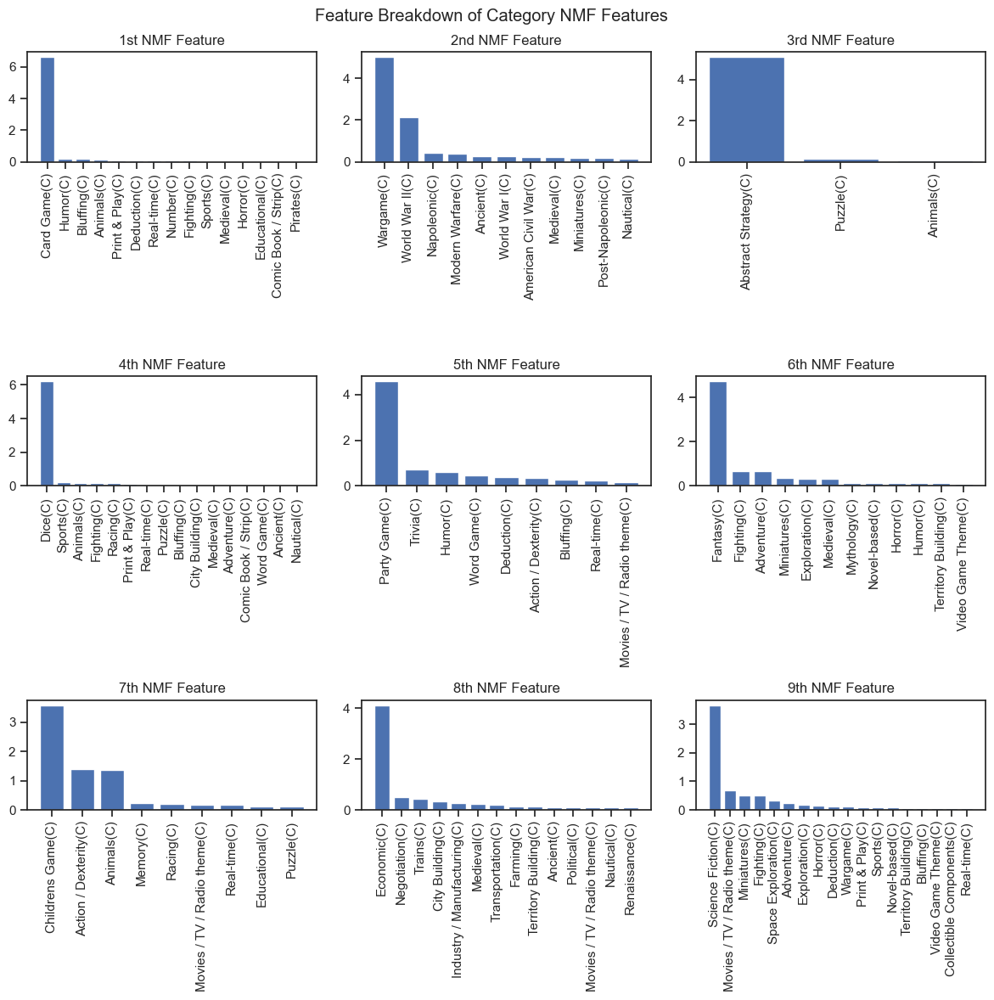

In [56]:
## Create the subplots
fig, axs = plt.subplots(3, 3, figsize=(12, 12))

## Loop over all the basis vectors
for i in range(9):

    ## Obtain the pre-image of the i-th basis vector
    feature_vec = get_feature(i, NMF_category_model)
    ## Obtain the significant arguments of the pre-image vecotr
    sig_args = get_sig_args(feature_vec,0.9)

    ## Set the current axis and plot the bar graph
    ax = axs[i//3,i%3]
    x_ticks = np.arange(len(sig_args))  
    ax.bar(x_ticks, feature_vec[sig_args])
    ax.set_xticks(x_ticks)

    ## We must add 15 to sig_args as the Categories features column start at index 15.
    ax.set_xticklabels(cols[15+sig_args], rotation=90)
    if i+1 == 1:
        ax.set_title('1st NMF Feature')
    elif i+1 == 2:
        ax.set_title('2nd NMF Feature')
    elif i+1 == 3:
        ax.set_title('3rd NMF Feature')
    else:
        ax.set_title(str(i+1)+'th NMF Feature')


plt.suptitle('Feature Breakdown of Category NMF Features')
plt.tight_layout()
plt.show()

We can now visually inspect these graphs to see which of the original features are important for each of the new NMF features. We name the new features accordingly:

1. Card
2. War
3. Abstract
4. Dice
5. Party
6. Fantasy
7. Children
8. Economic
9. SciFi

We rename the columns of NMF_X_train_categories accordingly.

In [57]:
NMF_X_train_categories.rename(columns = { 0: 'Card', 1 : 'War', 2 : 'Abstract', 3 : 'Dice', 4 : 'Party', 5 : 'Fantasy', 6 : 'Children', 7 : 'Economic', 8 : 'SciFi' }, inplace=True)
NMF_X_train_categories

,Card,War,Abstract,Dice,Party,Fantasy,Children,Economic,SciFi
0,0.076117,0.000000,0.000043,0.000813,0.004425,0.000000,0.003623,0.000000,0.001195
1,0.022381,0.000000,0.000000,0.000717,0.003942,0.036848,0.000764,0.004098,0.005510
2,0.074992,0.000000,0.000000,0.000000,0.000000,0.099169,0.000000,0.000000,0.000000
3,0.000046,0.041153,0.000000,0.000663,0.000000,0.007774,0.000000,0.000000,0.078815
4,0.000000,0.000000,0.000000,0.000000,0.003571,0.000000,0.147254,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...
19514,0.000000,0.000000,0.000000,0.159880,0.000000,0.000000,0.000000,0.000000,0.000000
19515,0.000000,0.000000,0.000000,0.000000,0.003571,0.000000,0.147254,0.000000,0.000000
19516,0.000963,0.002584,0.000233,0.000000,0.000547,0.000197,0.000000,0.006193,0.001601
19517,0.000806,0.000000,0.002206,0.001428,0.000000,0.000896,0.100437,0.000257,0.000000


##### Feature Pairplots

We now plot the pairplots of the dimension reduced Categories features.

c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

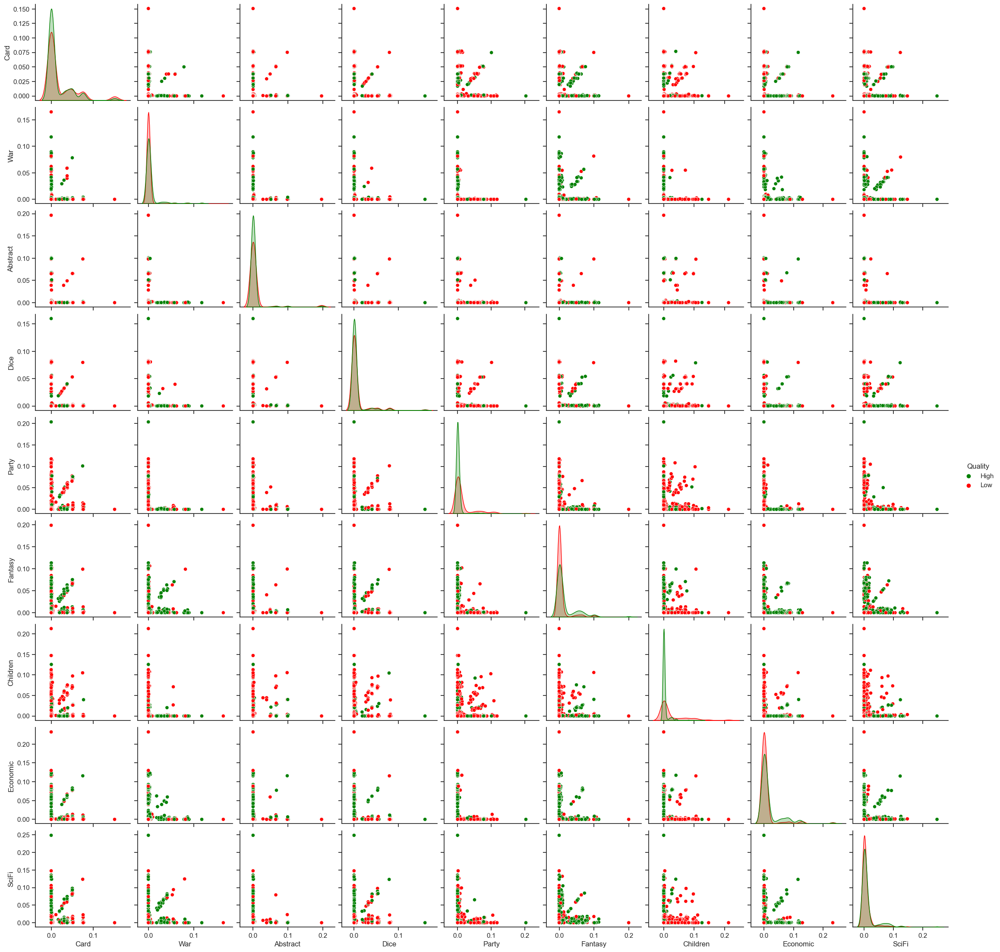

In [58]:
## Set the Quality of the games as before and extract only those with high and low quality
NMF_X_train_categories['Quality'] = NMF_X_train['Quality']
NMF_X_train_categories_highlow = NMF_X_train_categories[NMF_X_train_categories['Quality'] != 'Average']

## Plot the pairplots using the same quality palette as before
sns.set(style="ticks")
category_scatterplot = sns.pairplot(NMF_X_train_categories_highlow, hue='Quality', palette=quality_palette, hue_order = ['High','Low'])
plt.show()

We see interesting linear patterns in these plots. Specifically, it seems that having both high 'Economic' and 'SciFi' feautres are a predictor of a high rated game, while 'Party' games with lots of 'Dice' are a predictor of a low rated game/

#### Mechanics

As with Categories, there are multiple possible Mechanics, so to plot we would need to reduce the dimension with an NMF model.

##### NMF Model

Define, fit and transform the NMF model on the cateogry features.

In [59]:
## Obtain and extract the columns correspind to the mechanics
mechanic_cols = cols[98:]
X_train_mechanic = X_train[mechanic_cols].copy()

## Create the NMF model
NMF_mechanic_model = NMF(n_components = 9, max_iter =1000)

## Fit and tranform the model on X_train_categories
NMF_X_train_mechanic = pd.DataFrame(NMF_mechanic_model.fit_transform(X_train_mechanic))


## Visually inspect the new DataFrame
NMF_X_train_mechanic


,0,1,2,3,4,5,6,7,8
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.112342,0.000000,0.000000,0.039653
1,0.003164,0.057007,0.001171,0.000000,0.000127,0.004662,0.012400,0.010545,0.000431
2,0.000000,0.097409,0.000000,0.000000,0.000000,0.000000,0.000000,0.124454,0.000000
3,0.076051,0.003822,0.000000,0.000000,0.000000,0.000000,0.023338,0.008814,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...
19514,0.071281,0.000000,0.089933,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
19515,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
19516,0.032915,0.001887,0.000420,0.006592,0.000000,0.004445,0.004791,0.004439,0.000000
19517,0.000000,0.000000,0.000000,0.000000,0.000000,0.124353,0.000000,0.002771,0.025823


##### Renaming the new NMF Features

Perform the same analysis on the new NMF features to obtain relevant names.

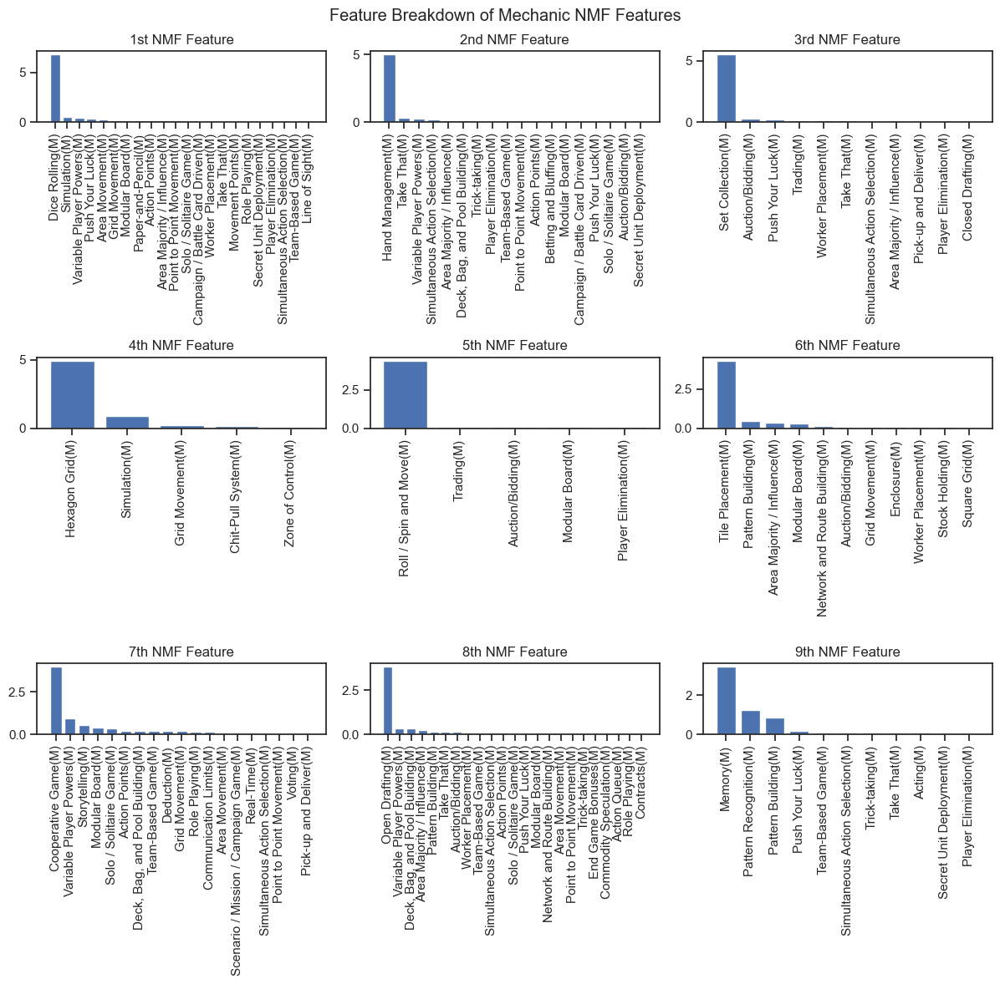

In [60]:
## Create the subplots
fig, axs = plt.subplots(3, 3, figsize=(12, 12))

## Loop over all the basis vectors
for i in range(9):

    ## Obtain the pre-image of the i-th basis vector
    feature_vec = get_feature(i, NMF_mechanic_model)
    ## Obtain the significant arguments of the pre-image vecotr
    sig_args = get_sig_args(feature_vec,0.9)

    ## Set the current axis and plot the bar graph
    ax = axs[i//3,i%3]
    x_ticks = np.arange(len(sig_args))  
    ax.bar(x_ticks, feature_vec[sig_args])
    ax.set_xticks(x_ticks)

    ## We must add 98 to sig_args as the mechanics features start at index 98
    ax.set_xticklabels(cols[98+sig_args], rotation=90)
    if i+1 == 1:
        ax.set_title('1st NMF Feature')
    elif i+1 == 2:
        ax.set_title('2nd NMF Feature')
    elif i+1 == 3:
        ax.set_title('3rd NMF Feature')
    else:
        ax.set_title(str(i+1)+'th NMF Feature')


plt.suptitle('Feature Breakdown of Mechanic NMF Features')
plt.tight_layout()
plt.show()

We can now visually inspect these graphs to see which of the original features are important for each of the new NMF features. We name the new features accordingly:

1. Dice
2. Card
3. Collecting
4. Hexagon Grid
5. Roll/Spin to Move
6. Tile Placement
7. Co-op
8. Open Drafting
9. Memory

We rename the columns of NMF_X_train_mechanic accordingly.

In [61]:
NMF_X_train_mechanic.rename(columns = { 0: 'Dice', 1 : 'Card', 2 : 'Collecting', 3 : 'Hexagon Grid', 4 : 'Roll/Spin to Move', 5 : 'Tile Placement', 6 : 'Co-op', 7 : 'Open Drafting', 8 : 'Memory' }, inplace=True)
NMF_X_train_mechanic

,Dice,Card,Collecting,Hexagon Grid,Roll/Spin to Move,Tile Placement,Co-op,Open Drafting,Memory
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.112342,0.000000,0.000000,0.039653
1,0.003164,0.057007,0.001171,0.000000,0.000127,0.004662,0.012400,0.010545,0.000431
2,0.000000,0.097409,0.000000,0.000000,0.000000,0.000000,0.000000,0.124454,0.000000
3,0.076051,0.003822,0.000000,0.000000,0.000000,0.000000,0.023338,0.008814,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...
19514,0.071281,0.000000,0.089933,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
19515,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
19516,0.032915,0.001887,0.000420,0.006592,0.000000,0.004445,0.004791,0.004439,0.000000
19517,0.000000,0.000000,0.000000,0.000000,0.000000,0.124353,0.000000,0.002771,0.025823


##### Feature Pairplot

We now plot the pairplots of the dimension reduced Mechanic features.

c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

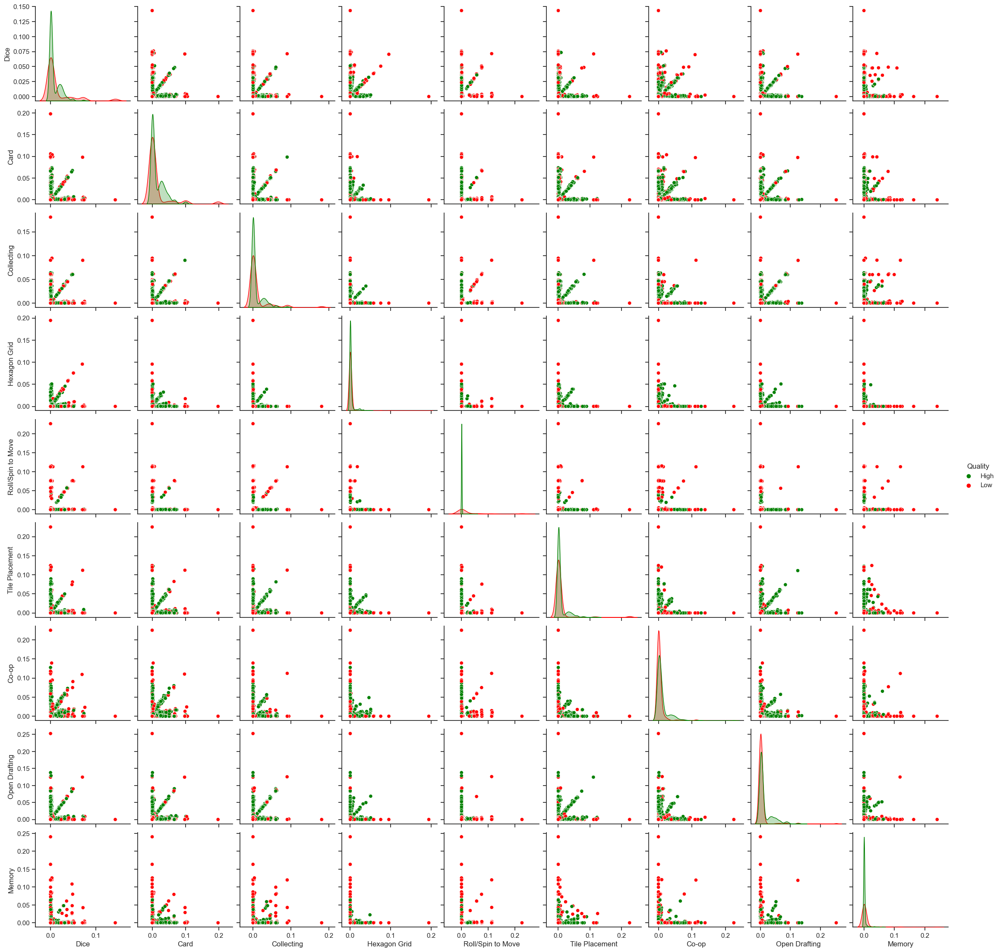

In [62]:
## Set the Quality of the games as before and extract only those with high and low quality
NMF_X_train_mechanic['Quality'] = NMF_X_train['Quality']
NMF_X_train_mechanic_highlow = NMF_X_train_mechanic[NMF_X_train_mechanic['Quality'] != 'Average']

## Plot the pairplots using the same quality palette as before
sns.set(style="ticks")
mechanic_scatterplot = sns.pairplot(NMF_X_train_mechanic_highlow, hue='Quality', palette=quality_palette, hue_order = ['High','Low'])
plt.show()

We see a similar plots as in the Categories pairplots.

## 4. Model Training

### Description

In this phase, we will train several models. We will begin with a linear regression mode and then design and train neural networks with some hyper paremeter tuning. 

We will also evaluate the models with the metrics Precision, Accuracy, Recall and F1 under varying cutoffs.

In [63]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from itertools import product
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras import callbacks

### Steps

1. **Linear Models:** Train and evaluate a linear models with hyper-parameter tuning.
2. **Neural Networks:** Train and evaluate neural networks with hyper-parameter tuning.

### Linear Models

#### Base Model

We begin by initializing the model and fitting it to the train data

In [64]:
linear_base = LinearRegression().fit(X_train,y_train)

Now, we split the test data into it's input and output values, predict the outputs of the linear model and compute the mean squared error of the predictions with the true values.

In [65]:
## Extract the input and output test data
X_test = df_test[cols[2:]]
y_test = df_test['Rating']

## Use the linear model to predict the rating of the test data
y_pred_linear_base = linear_base.predict(X_test)

## Compute the mean squared error for the test data and the predicted data
mse_linear = mean_squared_error(y_pred_linear_base,y_test)

print('The mean squared error of the test data for the linear regression model is', mse_linear)

The mean squared error of the test data for the linear regression model is 0.0035041040022830393


This seems like a decent mean squared error, however this could be misleading due to the large clustering of ratings in the 'Average' range and, since we want to predict when a game is highly rated, further investigation is required.

In [66]:
max_predicted_linear = np.max(y_pred_linear_base)

print('The maximumim the linear model predicts is', max_predicted_linear, ' while there are', (y_test>max_predicted_linear).sum(), 'test games with higher ratings.' ) 

The maximumim the linear model predicts is 0.7685133812855267  while there are 47 test games with higher ratings.


We see that it does not do a good job in predicting the rating of a game with a very high rating. However, this model still may be okay as we don't necessarily want to know in advanced the rating of the game, just that it will be high. Hence, we may consider evaluating this model on other metrics.

#### Precision, Accuracy, Recall and F1 Metrics

Since we care most about correctly predicting a game will be highly rated, we will focus more on Precision and Accuracy. However, we compute Recall and F1 to understand further how our models are fairing.

We define functions to compute the precision, accuracy, recall and F1 score of two arrays of numbers between 0 and 1 given some cutoff. 



In [67]:
## Four helper functions to compute True Positve, False Positive, True Negative and False Negative given two binary arrays.
def true_pos(true_binary,pred_binary):
    return (true_binary*pred_binary).sum()

def false_pos(true_binary,pred_binary):
    return ((1-true_binary)*pred_binary).sum()

def true_neg(true_binary,pred_binary):
    return ((1-true_binary)*(1-pred_binary)).sum()

def false_neg(true_binary,pred_binary):
    return (true_binary*(1-pred_binary)).sum()


## Four functions that first binarize the data according to some cutoff and then computes the precision, accuracy, recall, and F1 scores
def precision(y_true,y_pred,cutoff):
    y_true_binary = (y_true>cutoff).astype(float)
    y_pred_binary = (y_pred>cutoff).astype(float)

    tp = true_pos(y_true_binary,y_pred_binary)
    fp = false_pos(y_true_binary,y_pred_binary)

    if tp+fp==0:
        return np.nan

    precision = tp/(tp+fp)

    return precision

def accuracy(y_true,y_pred,cutoff):
    y_true_binary = (y_true>cutoff).astype(float)
    y_pred_binary = (y_pred>cutoff).astype(float)

    tp = true_pos(y_true_binary,y_pred_binary)
    tn = true_neg(y_true_binary,y_pred_binary)

    accuracy = (tp+tn)/(len(y_true))

    return accuracy

def recall(y_true,y_pred,cutoff):
    y_true_binary = (y_true>cutoff).astype(float)
    y_pred_binary = (y_pred>cutoff).astype(float)

    tp = true_pos(y_true_binary,y_pred_binary)
    fn = false_neg(y_true_binary,y_pred_binary)

    if tp+fn ==0:
        return np.nan

    precision = tp/(tp+fn)

    return precision


def f1(y_true,y_pred,cutoff):

    p = precision(y_true,y_pred,cutoff)
    r = recall(y_true,y_pred,cutoff)

    if p+r == 0:
        return np.nan

    f1 = 2*p*r/(p+r)

    return f1

We now compute the Precision, Accuracy, Recall and F1 for cutoff equal to the mean of the test outputs plus various multiples of the standard deviations.

In [68]:
## Compute the mean and standard deviations of the test data
mean_test_rating = y_test.mean()
mean_test_std = y_test.std()

## Compute cutoffs of various multiples of the standard deviation away from the mean
cutoffs = mean_test_rating + mean_test_std*np.array([0.0,0.5,1.0,1.5,2.0])

## Initialize a DataFrame to collect the metrics
linear_base_metrics_df = pd.DataFrame(columns = ['Cutoff', 'Preicision','Accuracy','Recall','F1'])

## Loop over all the cutoffs
for idx, cutoff in enumerate(cutoffs):
    ## Compute precision, accuracy, recall and F1 of the various cutoffs
    p = precision(y_test, y_pred_linear_base,cutoff)
    a = accuracy(y_test, y_pred_linear_base,cutoff)
    r = recall(y_test, y_pred_linear_base,cutoff)
    f = f1(y_test, y_pred_linear_base,cutoff)

    ## Append the information in next row of the DataFrame
    linear_base_metrics_df.loc[idx] = np.array([cutoff,p,a,r,f])

## Output the DataFrame for visual inspection
linear_base_metrics_df   

,Cutoff,Preicision,Accuracy,Recall,F1
0,0.432297,0.518457,0.778860,0.829806,0.638182
1,0.471322,0.508081,0.852850,0.692837,0.586247
2,0.510347,0.558763,0.904249,0.522158,0.539841
3,0.549373,0.651163,0.930570,0.289406,0.400716
4,0.588398,0.666667,0.946943,0.184397,0.288889


We see that accuracy and precision tend to increase with the cutoff but that the recall and subsequently the F1 score decreases. Since we are most interested in predicting good games this indicates that a good cutoff may be one standard deviation above the mean.

#### Hyper Parameter Tuning

One of the issues with the predictive power of the model is that there are few very highly rated games. As we saw in the Data Inspection and Visualization section if we transform the outputs with a sigmoid function, we obtain more data that is highly rated, and our model may better capture the features that would make a game highly rated.

In [69]:
## Initialize the sigmoid weights and shifts
sigmoid_weights = [10,25,50]
sigmoid_shifts = [max_bin_average,median]

## Combine the signmoid weights and shifts with the cutoffs to form all the hyper parameters
hyper_params = list(product(sigmoid_weights,sigmoid_shifts))

## Initialize the DataFrame where we will collect our metrics
linear_metrics_df = pd.DataFrame(columns = ['Sigmoid Weight','Sigmoid Shifts','Cutoffs','Test MSE','Precision','Accuracy','Recall','F1'])

## Loop over all the hyper parameters
for w,s in hyper_params:
    
    ## Transform the train outputs
    transformed_y_train = sigmoid(y_train,w,s)

    ## Initialize a fit a new linear regression model with the now transformed train outputs
    globals()['linear_w={}_s={:.3f}'.format(w,s)] = LinearRegression().fit(X_train,transformed_y_train)

    ## Transform the test data, get the new predictions
    transformed_y_test = sigmoid(y_test,w,s)
    curr_y_pred = globals()['linear_w={}_s={:.3f}'.format(w,s)].predict(X_test)

    ## Examine the maximum test prediction
    curr_max_pred = np.max(curr_y_pred)
    print('For a sigmoid weight and shift of {} and {:.3f}, the maximum test prediction is {:.3f}'.format(w,s,curr_max_pred))

    ## Compute the test MSE
    mse = mean_squared_error(transformed_y_test, curr_y_pred)

    ## Compute the transformed mean and standard deviation
    transformed_mean = transformed_y_test.mean()
    transformed_std = transformed_y_test.std()

    ## Compute the transformed cutoffs
    transformed_cutoffs = transformed_mean+transformed_std*np.array([0.0,0.5,1.0,1.5,2.0])

    ## Loop over the transformed cutoffs
    for c in transformed_cutoffs:
        
        ## Compute the metrics: Accuracy, Precision, Recall, F1
        a = accuracy(transformed_y_test, curr_y_pred, c)
        p = precision(transformed_y_test, curr_y_pred, c)
        r = recall(transformed_y_test, curr_y_pred, c)
        f = f1(transformed_y_test, curr_y_pred, c)

        ## Add the metrics into the last row of the DataFrame
        linear_metrics_df.loc[len(linear_metrics_df)] = np.array([w,s,c,mse,p,a,r,f])


## Print out the metrics DataFrame to visually inspect the metrics
linear_metrics_df

    


For a sigmoid weight and shift of 10 and 0.395, the maximum test prediction is 1.002
For a sigmoid weight and shift of 10 and 0.402, the maximum test prediction is 1.001
For a sigmoid weight and shift of 25 and 0.395, the maximum test prediction is 1.113
For a sigmoid weight and shift of 25 and 0.402, the maximum test prediction is 1.116


For a sigmoid weight and shift of 50 and 0.395, the maximum test prediction is 1.185
For a sigmoid weight and shift of 50 and 0.402, the maximum test prediction is 1.207


,Sigmoid Weight,Sigmoid Shifts,Cutoffs,Test MSE,Precision,Accuracy,Recall,F1
0,10.0,0.395000,0.571876,0.008337,0.562865,0.778238,0.811783,0.664787
1,10.0,0.395000,0.634431,0.008337,0.588288,0.852435,0.719163,0.647175
2,10.0,0.395000,0.696986,0.008337,0.620573,0.888705,0.541176,0.578162
3,10.0,0.395000,0.759542,0.008337,0.735294,0.912124,0.288462,0.414365
4,10.0,0.395000,0.822097,0.008337,0.797297,0.928083,0.150895,0.253763
5,10.0,0.402236,0.555241,0.008791,0.559574,0.778446,0.813612,0.663095
6,10.0,0.402236,0.619426,0.008791,0.585740,0.852850,0.721111,0.646414
7,10.0,0.402236,0.683610,0.008791,0.616949,0.890155,0.544910,0.578696
8,10.0,0.402236,0.747794,0.008791,0.733990,0.912953,0.289320,0.415042
9,10.0,0.402236,0.811979,0.008791,0.776316,0.928083,0.151671,0.253763


The first thing we notice is that our model can now predict values up to (and above) 1.0, an improvement from the previous model. However, if our weight is too large, we seem to predict some games are too highly rated.

In [70]:
max_precision_row = linear_metrics_df.loc[linear_metrics_df['Precision'].idxmax()]
max_accuracy_row = linear_metrics_df.loc[linear_metrics_df['Accuracy'].idxmax()]
max_recall_row = linear_metrics_df.loc[linear_metrics_df['Recall'].idxmax()]
max_f1_row = linear_metrics_df.loc[linear_metrics_df['F1'].idxmax()]

print('The maximum precision is {:.3f} with hyper parameters:'.format(max_precision_row['Precision']))
print(max_precision_row[['Sigmoid Weight','Sigmoid Shifts','Cutoffs']])
print()
print('The maximum accuracy is {:.3f} with hyper parameters:'.format(max_accuracy_row['Accuracy']))
print(max_accuracy_row[['Sigmoid Weight','Sigmoid Shifts','Cutoffs']])
print()
print('The maximum recall is {:.3f} with hyper parameters:'.format(max_recall_row['Recall']))
print(max_recall_row[['Sigmoid Weight','Sigmoid Shifts','Cutoffs']])
print()
print('The maximum F1 scoare is {:.3f} with hyper parameters:'.format(max_f1_row['F1']))
print(max_f1_row[['Sigmoid Weight','Sigmoid Shifts','Cutoffs']])
print()


The maximum precision is 0.836 with hyper parameters:
Sigmoid Weight    50.000000
Sigmoid Shifts     0.402236
Cutoffs            0.948698
Name: 28, dtype: float64

The maximum accuracy is 0.999 with hyper parameters:
Sigmoid Weight    50.000000
Sigmoid Shifts     0.395000
Cutoffs            1.076858
Name: 24, dtype: float64

The maximum recall is 0.814 with hyper parameters:
Sigmoid Weight    10.000000
Sigmoid Shifts     0.402236
Cutoffs            0.555241
Name: 5, dtype: float64

The maximum F1 scoare is 0.728 with hyper parameters:
Sigmoid Weight    50.000
Sigmoid Shifts     0.395
Cutoffs            0.660
Name: 20, dtype: float64



### Neural Networks

#### Base Model

We begin by initializing the base neural network model and compiling it.

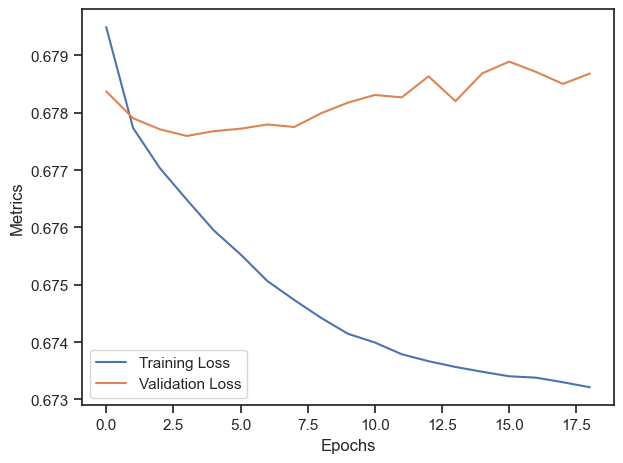

In [71]:
## Initialize the neural network
NN_base = Sequential([Dense(128, activation='relu', input_shape=(287,)),
                                Dense(32, activation='relu'),
                                Dense(8, activation='relu'),
                                Dense(1, activation='sigmoid')])

## Compile the network
NN_base.compile(optimizer='adam', loss='binary_crossentropy')

## Create an early stopping callback to speed up training
early_stopping = callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, start_from_epoch=10)

## Train the model
history_base = NN_base.fit(X_train, y_train, epochs=50, batch_size=32,validation_split=0.2, callbacks = [early_stopping], verbose=False)

## Plot the training history
plt.plot(history_base.history['loss'], label='Training Loss')
plt.plot(history_base.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.tight_layout()
plt.show()



We see that the loss is not as good as we may hope for but that at least the validation loss is not far from the training loss indicating we are not overfitting.

In [72]:
y_pred_NN_base = NN_base.predict(X_test,verbose=False).squeeze()
test_bce = binary_crossentropy(y_test, y_pred_NN_base).numpy()

print('The maximum predicted output is ', np.max(y_pred_NN_base))
print('The binary cross entropy of the test data with the predictions is ', test_bce)

The maximum predicted output is  0.8841227
The binary cross entropy of the test data with the predictions is  0.67798406


So, we see that our base Neural Networks performs better than our base linear model in that it can predict higher output values. However, the loss is not as good as we may hope for, but at least indicates we are not overitting the train data.

Let us examin the other metrics to see how it compares with the base inear model.

#### Precision, Accuracy, Recall and F1 Metrics

We use the same functions are defined above to compute the precicision, accuracy, recall and F1 score of the base Neural Network.

In [73]:
## Initialize a DataFrame to collect the metrics
NN_base_metrics_df = pd.DataFrame(columns = ['Cutoff', 'Preicision','Accuracy','Recall','F1'])

## Loop over all the cutoffs
for idx, cutoff in enumerate(cutoffs):
    ## Compute precision, accuracy, recall and F1 of the various cutoffs
    p = precision(y_test, y_pred_NN_base,cutoff)
    a = accuracy(y_test, y_pred_NN_base,cutoff)
    r = recall(y_test, y_pred_NN_base,cutoff)
    f = f1(y_test, y_pred_NN_base,cutoff)

    ## Append the information in next row of the DataFrame
    NN_base_metrics_df.loc[idx] = np.array([cutoff,p,a,r,f])

## Output the DataFrame for visual inspection
NN_base_metrics_df 

,Cutoff,Preicision,Accuracy,Recall,F1
0,0.432297,0.654652,0.841451,0.688713,0.671251
1,0.471322,0.662651,0.894301,0.606061,0.633094
2,0.510347,0.624146,0.915026,0.527938,0.572025
3,0.549373,0.598726,0.932642,0.485788,0.536377
4,0.588398,0.547511,0.945907,0.429078,0.481113


We observe that the Precision and Accuracy (the metrics we care most about) fair much better with this base model.

#### Hyper Parameter Tuning

In [74]:
## Initialize the DataFrame where we will collect our metrics
NN_metrics_df = pd.DataFrame(columns = ['Sigmoid Weight','Sigmoid Shifts','Cutoffs','Test BCE','Precision','Accuracy','Recall','F1'])

## Loop over all the hyper parameters
for w,s in hyper_params:
    
    ## Transform the train outputs
    transformed_y_train = sigmoid(y_train,w,s)

    ## Initialize a fit a new linear regression model with the now transformed train outputs
    globals()['NN_w={}_s={:.3f}'.format(w,s)] = Sequential([Dense(128, activation='relu', input_shape=(287,)),
                                                            Dense(32, activation='relu'),
                                                            Dense(8, activation='relu'),
                                                            Dense(1, activation='sigmoid')])
    

    ## Compile the network
    globals()['NN_w={}_s={:.3f}'.format(w,s)].compile(optimizer='adam', loss='binary_crossentropy')

    ## Create an early stopping callback to speed up training
    early_stopping = callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, start_from_epoch=10)

    ## Train the model
    globals()['history_w={}_s={:.3f}'.format(w,s)] = globals()['NN_w={}_s={:.3f}'.format(w,s)].fit(X_train, y_train, epochs=50, batch_size=32,validation_split=0.2, callbacks = [early_stopping], verbose=False)


    ## Transform the test data, get the new predictions
    transformed_y_test = sigmoid(y_test,w,s)
    curr_y_pred = globals()['NN_w={}_s={:.3f}'.format(w,s)].predict(X_test, verbose=False).squeeze()

    ## Examine the maximum test prediction
    curr_max_pred = np.max(curr_y_pred)
    print('For a sigmoid weight and shift of {} and {:.3f}, the maximum test prediction is {:.3f}'.format(w,s,curr_max_pred))

    ## Compute the test MSE
    bce = binary_crossentropy(y_test, curr_y_pred).numpy()

    ## Compute the transformed mean and standard deviation
    transformed_mean = transformed_y_test.mean()
    transformed_std = transformed_y_test.std()

    ## Compute the transformed cutoffs
    transformed_cutoffs = transformed_mean+transformed_std*np.array([0.0,0.5,1.0,1.5,2.0])

    ## Loop over the transformed cutoffs
    for c in transformed_cutoffs:
        
        ## Compute the metrics: Accuracy, Precision, Recall, F1
        a = accuracy(transformed_y_test, curr_y_pred, c)
        p = precision(transformed_y_test, curr_y_pred, c)
        r = recall(transformed_y_test, curr_y_pred, c)
        f = f1(transformed_y_test, curr_y_pred, c)

        ## Add the metrics into the last row of the DataFrame
        NN_metrics_df.loc[len(NN_metrics_df)] = np.array([w,s,c,mse,p,a,r,f])


## Print out the metrics DataFrame to visually inspect the metrics
NN_metrics_df

    


For a sigmoid weight and shift of 10 and 0.395, the maximum test prediction is 0.859
For a sigmoid weight and shift of 10 and 0.402, the maximum test prediction is 0.852
For a sigmoid weight and shift of 25 and 0.395, the maximum test prediction is 0.889
For a sigmoid weight and shift of 25 and 0.402, the maximum test prediction is 0.845
For a sigmoid weight and shift of 50 and 0.395, the maximum test prediction is 0.838
For a sigmoid weight and shift of 50 and 0.402, the maximum test prediction is 0.876


,Sigmoid Weight,Sigmoid Shifts,Cutoffs,Test BCE,Precision,Accuracy,Recall,F1
0,10.0,0.395000,0.571876,0.029368,0.936170,0.771606,0.168324,0.285344
1,10.0,0.395000,0.634431,0.029368,0.915385,0.834197,0.131057,0.229287
2,10.0,0.395000,0.696986,0.029368,0.875000,0.867772,0.072059,0.133152
3,10.0,0.395000,0.759542,0.029368,0.880000,0.896166,0.042308,0.080734
4,10.0,0.395000,0.822097,0.029368,0.777778,0.920000,0.017903,0.035000
5,10.0,0.402236,0.555241,0.029368,0.919732,0.784041,0.212684,0.345477
6,10.0,0.402236,0.619426,0.029368,0.868750,0.837927,0.154444,0.262264
7,10.0,0.402236,0.683610,0.029368,0.878788,0.871917,0.086826,0.158038
8,10.0,0.402236,0.747794,0.029368,0.900000,0.898238,0.052427,0.099083
9,10.0,0.402236,0.811979,0.029368,0.833333,0.920207,0.012853,0.025316


While the maximimum predictions are still higher than the base linear, they are relatively the same as the base Neural Network.

Further the Precision and Accuracy scores are all relatively high while the Recall and, subsequently, the F1 scores are all relatively low. This means that our models have more true positives than false positives but also have quite many false negatives. 

Therefore we can trust our model to tell us if a game will be highly rated more than we can trust if a game will be lower rated. This suits our purposes as we want to use our models to generated highly rated games. 

## 5. Using Models to Predict

### Description

Now, we will use our models to generate features of games that we can predict to be highly rated. The realibility that the games we have generated will be highly rated depends on the realibility of the models we use. Therefore, we will primarily use the models that have the highest accuracy and precision, thus minimizing the chances of generating false positives.

In [75]:
from scipy.optimize import minimize

### Steps

1. **Linear Models**: Use optimization techniques to find groups of games with certain predicted outputs.
2. **Neural Networks**: Determine which features contribute most to a high ranking and generate games based on those rankings.

### Linear Models

#### Generate New Games with Prescribed Qualities

We define the functions we want to optimize as well as constraint functions to ensure our generated results are still in the form of our initial data set.

In [76]:
## Ensure the generated values have non-zero values
def positivity_constraint(X):
    return X

## Ensure the attributes are bounded by 1.0
def attribute_constraint(X):
    return 1-X[:5]

## Ensure that the minimum players is less than the maximum players
def player_constraint(X):
    return X[3]-X[2]

## Ensure the sudomain, category and mechanic columns sum 1 (to represent probabilities)
def subdomain_constraint(X):
    return 1-X[5:13].sum()

def category_constraint(X):
    return 1-X[13:96].sum()

def mechanic_constraint(X):
    return 1-X[96:].sum()

constraints = ({'type': 'ineq', 'fun': positivity_constraint},
                {'type': 'ineq', 'fun': attribute_constraint},
                {'type': 'ineq', 'fun': player_constraint},
                {'type': 'eq', 'fun': subdomain_constraint},
                {'type': 'eq', 'fun': category_constraint},
                {'type': 'eq', 'fun': mechanic_constraint})


## Define the objective function to be minimized
def objective(X, model, target):
    X = pd.DataFrame(X.reshape(1,-1),columns = cols[2:])
    y = model.predict(X)[0]
    return (y - target)**2


Using the base linear model and the linear model with the best hyper parameters (w=10, s=0.395), we define a function that will define a function that will generate a DataFrame with a given number of high, average and low rated games based on the two linear models.

In [77]:
def generate_games(n_high,n_average,n_low):

    ## Initialize the DataFrame
    generated_linear_df = pd.DataFrame(columns = list(cols[2:])+['Quality','Model'])

    ## Initialize the best linear model
    linear_best = globals()['linear_w={}_s={:.3f}'.format(10,0.395)]

    ## Loop over the number of high rated games you want to generate
    for _ in range(n_high):

        ## Starting from a random input X, optimize it to find an input whose base linear output is close to 1
        rand_X = np.random.rand(287)
        high_base_result = minimize(lambda X : objective(X,linear_base,1), rand_X, constraints=constraints).x
        generated_linear_df.loc[len(generated_linear_df)] = list(high_base_result) + ['High','Base']

        ## Starting from a random input X, optimize it to find an input whose best linear output is close to 1
        rand_X = np.random.rand(287)
        good_best_result = minimize(lambda X : objective(X,linear_best,1), rand_X, constraints=constraints).x
        generated_linear_df.loc[len(generated_linear_df)] = list(good_best_result) + ['High','Best']

    ## Loop over the number of average rated games you want to generate
    for _ in range(n_average):
        
        ## Starting from a random input X, optimize it to find an input whose base linear output is close to 0.5
        rand_X = np.random.rand(287)
        average_base_result = minimize(lambda X : objective(X,linear_base,0.5), rand_X, constraints=constraints).x
        generated_linear_df.loc[len(generated_linear_df)] = list(average_base_result) + ['Average','Base']
    
        ## Starting from a random input X, optimize it to find an input whose best linear output is close to 0.5
        rand_X = np.random.rand(287)
        average_best_result = minimize(lambda X : objective(X,linear_best,0.5), rand_X, constraints=constraints).x
        generated_linear_df.loc[len(generated_linear_df)] = list(average_best_result) + ['Average','Best']
    
    ## Loop over the number of low rated games you want to generate
    for _ in range(n_low):

        ## Starting from a random input X, optimize it to find an input whose base linear output is close to 0
        rand_X = np.random.rand(287)
        low_base_result = minimize(lambda X : objective(X,linear_base,0), rand_X, constraints=constraints).x
        generated_linear_df.loc[len(generated_linear_df)] = list(low_base_result) + ['Low','Base']

        ## Starting from a random input X, optimize it to find an input whose best linear output is close to 0
        rand_X = np.random.rand(287)
        low_best_result = minimize(lambda X : objective(X,linear_best,0), rand_X, constraints=constraints).x
        generated_linear_df.loc[len(generated_linear_df)] = list(low_best_result) + ['Low','Best']

    return generated_linear_df
    

We now wish to generate 50 high, average and low rated games based on the base and best linear models.

In [78]:
## Generating the games may take a while so to save time we comment out the next two lines and, instead load in a pre generated DataFrame
# generated_linear_df = generate_games(50,50,50)
# generated_linear_df.to_csv('Generated Games with Linear Models.csv', index=False)

## Load in the saved DataFrame that the previous cell would generate
generated_linear_df = pd.read_csv('Generated Games with Linear Models.csv')

## Visually inspect the new DataFrame
generated_linear_df.head()

,Complexity,Minimum Age,Minimum Players,Max Players,Play Time,Childrens Games(D),Abstract Games(D),Customizable Games(D),Family Games(D),Party Games(D),...,Variable Player Powers(M),Variable Set-up(M),Victory Points as a Resource(M),Voting(M),"Worker Placement, Different Worker Types(M)",Worker Placement with Dice Workers(M),Worker Placement(M),Zone of Control(M),Quality,Model
0,0.063060,0.110751,0.817661,0.846296,0.006699,0.323453,1.214306e-17,5.394949e-03,0.013525,0.000000e+00,...,-1.517883e-18,-1.409463e-18,-3.252607e-19,-6.505213e-18,1.734723e-18,-4.336809e-18,4.662069e-18,4.336809e-18,High,Base
1,0.069012,0.018786,0.901643,0.926312,0.836902,0.834863,5.851645e-02,-1.474515e-17,0.014663,6.066982e-03,...,1.084202e-19,0.000000e+00,1.084202e-19,1.084202e-19,1.084202e-19,1.084202e-19,1.084202e-19,0.000000e+00,High,Best
2,0.064495,0.397474,0.378819,0.407924,0.751863,0.530920,3.554668e-01,1.734723e-18,0.013253,5.116513e-03,...,4.336809e-19,4.336809e-19,2.168404e-19,3.252607e-19,3.252607e-19,7.589415e-19,1.084202e-19,3.252607e-19,High,Base
3,0.072827,0.019275,0.893133,0.926122,0.740619,0.848025,3.451831e-09,4.890651e-10,0.019152,1.001463e-03,...,2.168404e-19,1.823855e-09,2.168404e-19,2.168404e-19,1.106810e-09,1.669161e-09,2.168404e-19,2.168404e-19,High,Best
4,0.067120,0.101433,0.969527,0.996899,0.516648,0.303643,1.447222e-09,-1.040834e-17,0.010953,1.873508e-09,...,0.000000e+00,-1.084202e-19,-2.168404e-19,8.226995e-10,3.904841e-10,1.062703e-09,5.353667e-10,1.084202e-19,High,Base


#### Plot the Generated Games

We now use the NMF model train in Data Inspection and Visiualization section to reduce the dimensions of the generated games and then plot the pairplots.

In [79]:
## Remove the last two identifier columns from the generated games DataFrame
truncated_generated_linear_df = generated_linear_df.iloc[:,:-2]

## Due to approximations, some inputs may be slightly negative. We set them equal to 0 in order to apply the NMF model
truncated_generated_linear_df[truncated_generated_linear_df<0]=0

## Create the new NMF DataFrame
NMF_generated_linear_df = pd.DataFrame(NMF_model.transform(truncated_generated_linear_df), columns = NMF_X_train.columns[:-1])

## Add in a 'Hue' columns
NMF_generated_linear_df['Type'] = generated_linear_df['Quality'] + ', ' + generated_linear_df['Model']

## Visually inspect the new DataFrame
NMF_generated_linear_df.head()

,Party,War,Strategy,Family,Abstract,Card,Complex,Children,Dice,Type
0,0.068802,0.049288,0.000000,0.000000,0.000000,0.003281,0.000000,0.053879,0.0,"High, Base"
1,0.058178,0.019651,0.009301,0.000000,0.000000,0.000000,0.045654,0.141374,0.0,"High, Best"
2,0.017189,0.012706,0.008603,0.000163,0.035905,0.000000,0.088967,0.088096,0.0,"High, Base"
3,0.059837,0.022982,0.010298,0.000000,0.000000,0.000000,0.031483,0.143282,0.0,"High, Best"
4,0.085300,0.078645,0.000000,0.000000,0.000000,0.000000,0.000000,0.053431,0.0,"High, Base"


c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

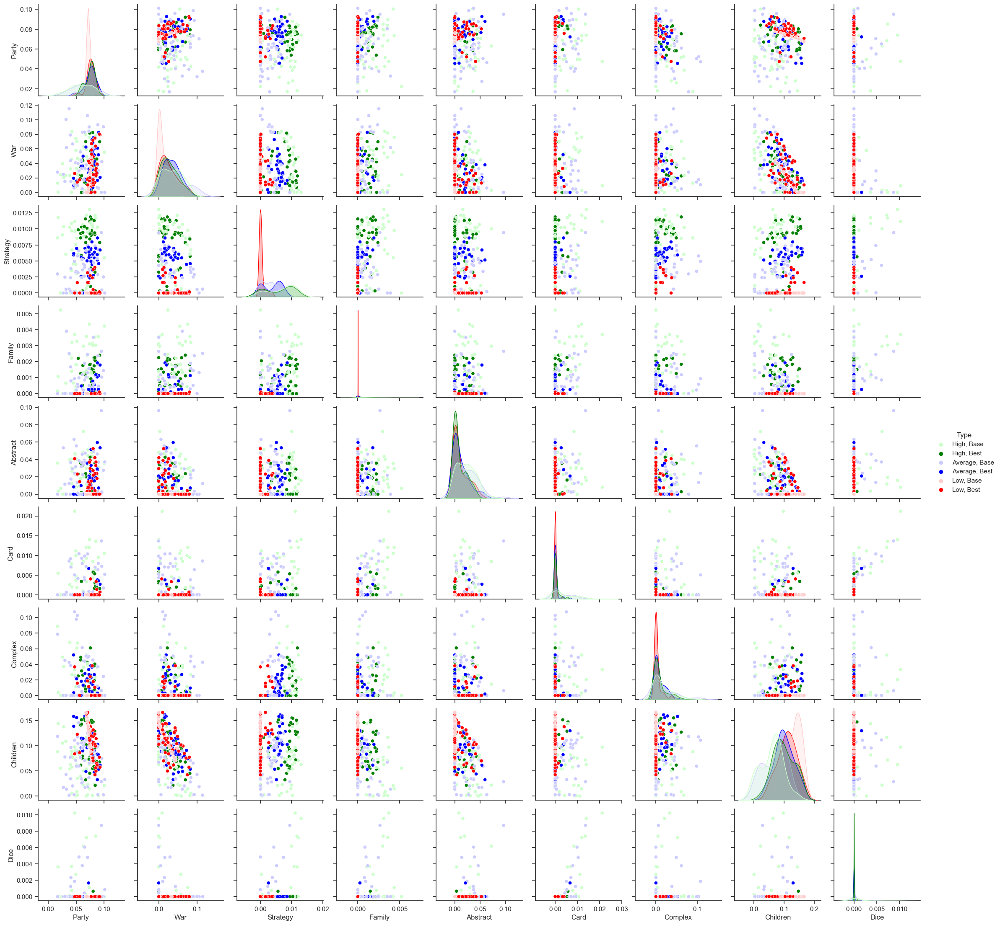

In [80]:
## Set the colours of the base linear model
light_red = '#FFCCCC'
light_green = '#CCFFCC'
light_blue = '#CCCCFF'

## Set the palette to be used
generated_linear_palette = {'High, Base' : light_green, 'Average, Base' : light_blue, 'Low, Base' :  light_red,
                            'High, Best' : 'Green', 'Average, Best' : 'Blue', 'Low, Best' : 'Red'}

## Remove some outlier points to get a better visualiztion
to_plot = NMF_generated_linear_df[NMF_generated_linear_df['Family']<0.015]

## Plot the scatterplot
sns.set(style="ticks")
scatterplot = sns.pairplot(to_plot, hue='Type', palette=generated_linear_palette)
plt.show()

We see that the two models tend to agree and that we may infer from the diagonals that:
- Games with high Strategy tend to be highly rated
- Games with high Children feature ten to low rated
- Party games have fairly similar chances of being high or low rated

The off-diagonals imply:
- Highly rated War games should have Strategy
- The inclusion of Dice does not drastically affect the rating of a game

#### Partial Feature Plots

Here we examine the various different types of features separately.

##### Attributes

c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

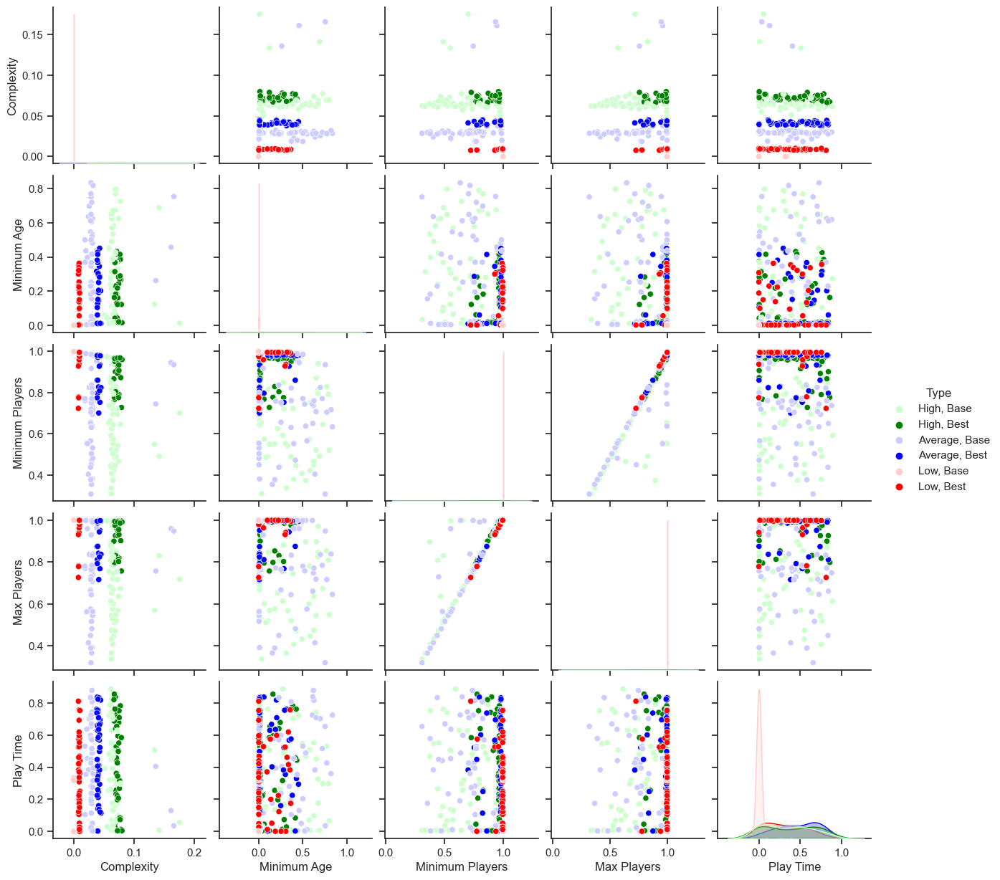

In [81]:
## Extract the attributes DataFrame and add on the Type column to be used for the hue
generated_attributes_df = generated_linear_df[cols[2:7]].copy()
generated_attributes_df['Type'] = generated_linear_df['Quality'] + ', ' + generated_linear_df['Model']

## Plot the scatterplot
sns.set(style="ticks")
scatterplot = sns.pairplot(generated_attributes_df, hue='Type', palette=generated_linear_palette)
plt.show()

Still we see that the two models tend to agree and we can infer that:
- High rated games should not have too low Complexity
- High rated games should not have the other attibutes at the extremes (i.e. not too high Max Players)

##### Subdomain

c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

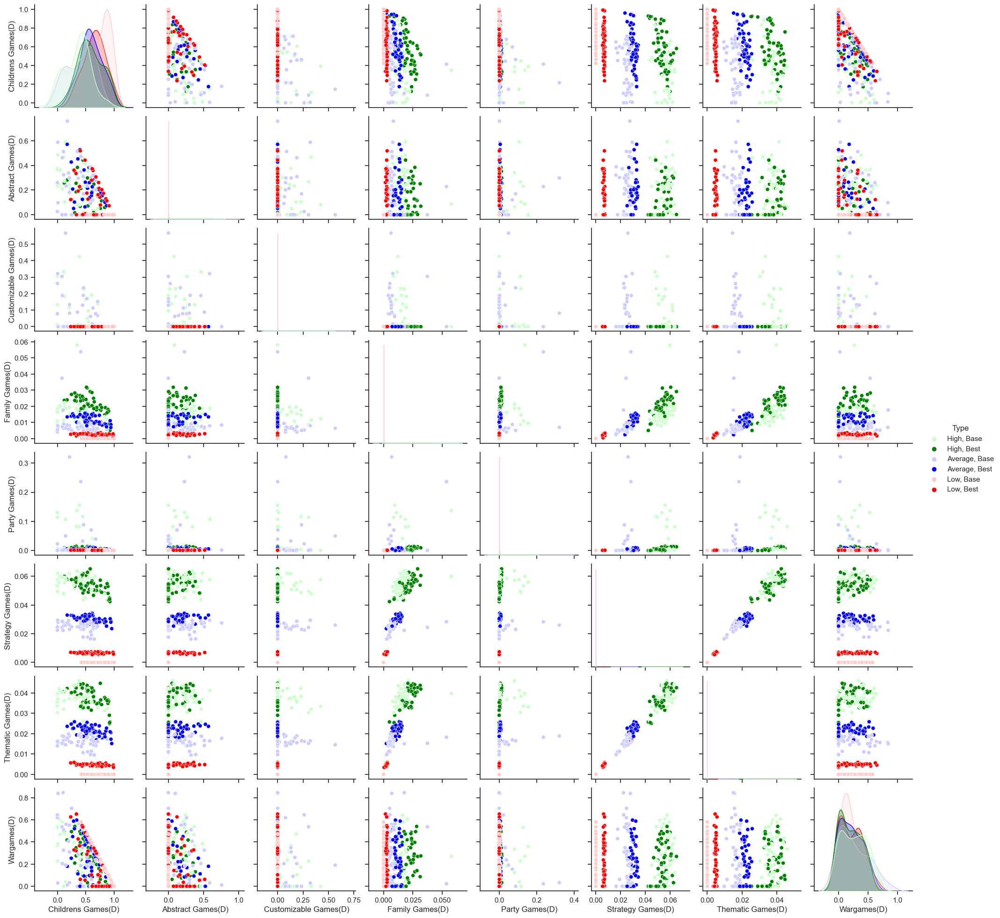

In [82]:
## Extract the subdomain DataFrame and add on the Type column to be used for the hue
generated_subdomain_df = generated_linear_df[cols[7:15]].copy()
generated_subdomain_df['Type'] = generated_linear_df['Quality'] + ', ' + generated_linear_df['Model']

## Remove some outlier points to get a better visualiztion
to_plot_subdomain = generated_subdomain_df[generated_subdomain_df['Family Games(D)']<0.09]


## Plot the scatterplot
sns.set(style="ticks")
scatterplot = sns.pairplot(to_plot_subdomain, hue='Type', palette=generated_linear_palette)
plt.show()

Again the two models agree and now we see:
- A strong positive correlation between Strategy Games, Thematic Games and Family Games
- No correlation between Abstract and Childrens games

##### Categories

c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

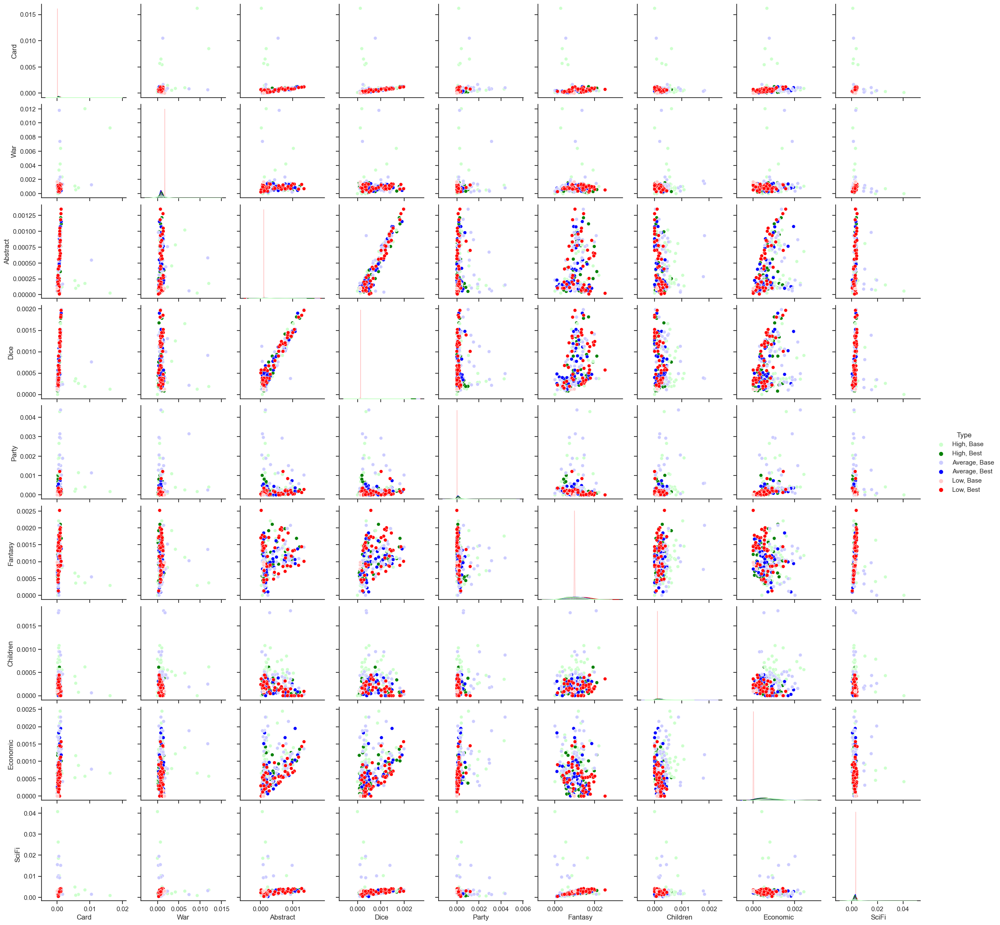

In [83]:
## Extract the attributes DataFrame
generated_categories_df = generated_linear_df[cols[15:98]].copy()

## Replace the negative values and transform the categories DataFrame with the NMF Categories model
generated_categories_df[generated_categories_df<0]=0
NMF_generated_categories_df = pd.DataFrame(NMF_category_model.transform(generated_categories_df),columns = NMF_X_train_categories.columns[:-1])

## Add on the Type column to be used as the hue of the plot
NMF_generated_categories_df['Type'] = generated_linear_df['Quality'] + ', ' + generated_linear_df['Model']

## Plot the scatterplot
sns.set(style="ticks")
scatterplot = sns.pairplot(NMF_generated_categories_df, hue='Type', palette=generated_linear_palette)
plt.show()

Our models don't seem to predict any concrete patterns for the Categories features.

##### Mechanics

c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

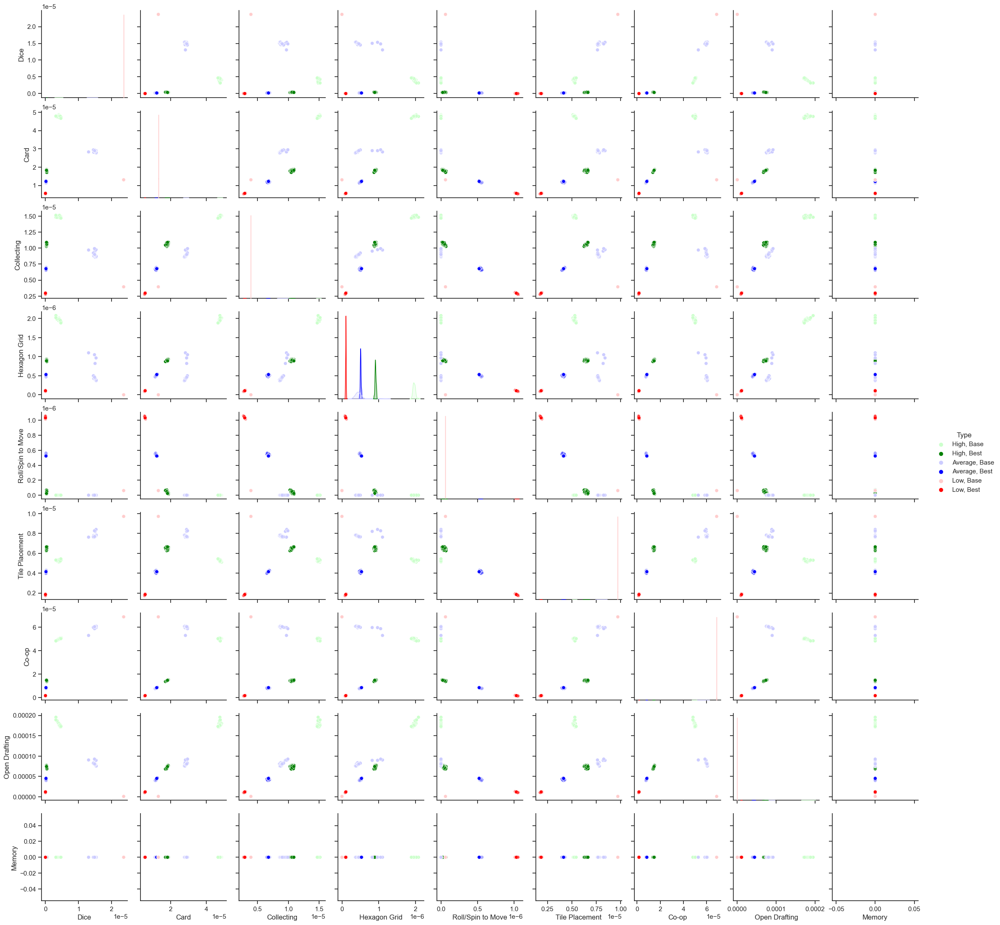

In [84]:
## Extract the attributes DataFrame
generated_mechanics_df = generated_linear_df[cols[98:]].copy()

## Replace the negative values and transform the categories DataFrame with the NMF Categories model
generated_mechanics_df[generated_mechanics_df<0]=0
NMF_generated_mechanics_df = pd.DataFrame(NMF_mechanic_model.transform(generated_mechanics_df),columns = NMF_X_train_mechanic.columns[:-1])

## Add on the Type column to be used as the hue of the plot
NMF_generated_mechanics_df['Type'] = generated_linear_df['Quality'] + ', ' + generated_linear_df['Model']

## Plot the scatterplot
sns.set(style="ticks")
scatterplot = sns.pairplot(NMF_generated_mechanics_df, hue='Type', palette=generated_linear_palette)
plt.show()

In [85]:
NMF_generated_mechanics_df

,Dice,Card,Collecting,Hexagon Grid,Roll/Spin to Move,Tile Placement,Co-op,Open Drafting,Memory,Type
0,4.056831e-06,0.000048,0.000015,1.994471e-06,0.000000e+00,0.000005,0.000050,1.784717e-04,0.0,"High, Base"
1,3.468245e-07,0.000019,0.000011,9.347338e-07,2.452569e-08,0.000006,0.000015,7.629315e-05,0.0,"High, Best"
2,4.541231e-06,0.000048,0.000015,1.934989e-06,0.000000e+00,0.000005,0.000050,1.748178e-04,0.0,"High, Base"
3,3.770296e-07,0.000018,0.000011,8.956549e-07,3.419229e-08,0.000007,0.000014,7.180314e-05,0.0,"High, Best"
4,4.063809e-06,0.000049,0.000015,2.013519e-06,0.000000e+00,0.000005,0.000050,1.800805e-04,0.0,"High, Base"
...,...,...,...,...,...,...,...,...,...,...
295,0.000000e+00,0.000005,0.000003,9.718691e-08,1.044813e-06,0.000002,0.000002,1.071520e-05,0.0,"Low, Best"
296,2.368073e-05,0.000013,0.000004,0.000000e+00,6.137554e-08,0.000010,0.000069,8.039907e-07,0.0,"Low, Base"
297,0.000000e+00,0.000005,0.000003,9.605367e-08,1.048015e-06,0.000002,0.000002,1.064137e-05,0.0,"Low, Best"
298,2.368073e-05,0.000013,0.000004,0.000000e+00,6.137554e-08,0.000010,0.000069,8.039907e-07,0.0,"Low, Base"


Here we see some slight disagreement in our models. However, they both predict separation of games predicted to be high, average or low rated. We can also infer that
- Roll/Spin to Move is negatively correlated with everything but Dice, for which it is uncorrelated
- Card, Collecting and Hexagon grid have positive or neutral correlation with all the other features except for Roll/Spin to Move.

### Neural Network Models

Now, we shall use the neural network models we have develope to predict which features of a game will make a game highly rated. Unfortunately, the same method of generating games as we used for the linear models does not work. Other in-built functions such employing stochastic methods would work but are less accurate and much more computationally expensive. 

Hence, we will instead predict the values of the basis vectors to infer which features are most likely to produce a high rated game.

#### Basis Feature Prediction

Here we predict the output of each basis vector for each of the nerual network models.

In [86]:
## Initialize the DataFrame consisting of all the basis vectors
basis_df = pd.DataFrame(np.eye(287), columns = cols[2:])

## Initialize the DataFrame that will hold the outputs
basis_outputs_df = pd.DataFrame(cols[2:], columns=['Feature'])

## Use the base NN to predict and add it to the DataFrame
NN_base_output = NN_base.predict(basis_df, verbose=False).squeeze()
basis_outputs_df['Base'] = NN_base_output

## Loop over all the hyper parameters
for w,s in hyper_params:

    ## Load the NN model, use it to predict and add it to the DataFrame
    curr_NN_model = globals()['NN_w={}_s={:.3f}'.format(w,s)]
    curr_NN_ouput = curr_NN_model.predict(basis_df,verbose=False).squeeze()
    basis_outputs_df['w={}, s={:.3f}'.format(w,s)] = curr_NN_ouput

## Visiually inspect the outputs
basis_outputs_df

,Feature,Base,"w=10, s=0.395","w=10, s=0.402","w=25, s=0.395","w=25, s=0.402","w=50, s=0.395","w=50, s=0.402"
0,Complexity,0.420764,0.406445,0.425738,0.410933,0.423203,0.437778,0.415647
1,Minimum Age,0.410622,0.403373,0.408428,0.408744,0.406591,0.401468,0.396349
2,Minimum Players,0.412735,0.387991,0.405681,0.400384,0.392452,0.398306,0.387909
3,Max Players,0.400506,0.402329,0.408007,0.407119,0.404732,0.398703,0.399372
4,Play Time,0.403446,0.401938,0.406613,0.401052,0.400933,0.392917,0.395187
...,...,...,...,...,...,...,...,...
282,Voting(M),0.424150,0.406244,0.408626,0.405417,0.415777,0.416595,0.389142
283,"Worker Placement, Different Worker Types(M)",0.409382,0.400267,0.388407,0.453666,0.424493,0.386212,0.385373
284,Worker Placement with Dice Workers(M),0.398103,0.481777,0.440239,0.424593,0.433996,0.442874,0.428272
285,Worker Placement(M),0.414823,0.407620,0.424513,0.408565,0.420970,0.417658,0.415887


#### Output Analyses

Here we will plot the feature breakdown of the outputs for each model and each subset of features.

##### Full

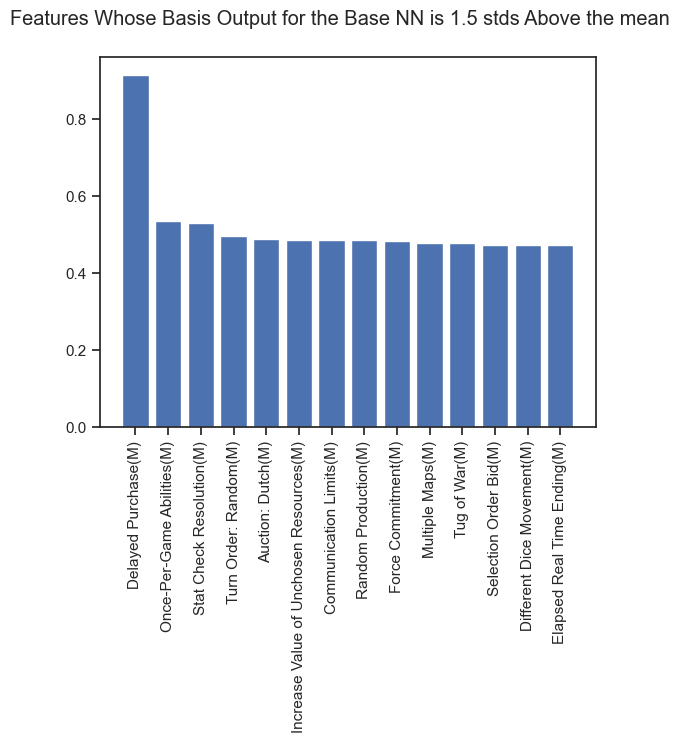

In [87]:
## Obtain the base column and compute the mean and std
base_outputs = basis_outputs_df['Base']
base_outputs_mean = np.mean(base_outputs)
base_outputs_std = np.std(base_outputs)

## Obtain the outputs that are one std above the mean
top_base_outputs = base_outputs[base_outputs > base_outputs_mean + 1.5*base_outputs_std].sort_values(ascending=False)

## Plot the bar graph
plt.bar(cols[2+top_base_outputs.index],top_base_outputs)
plt.xticks(rotation=90)
plt.suptitle('Features Whose Basis Output for the Base NN is 1.5 stds Above the mean')
plt.show()

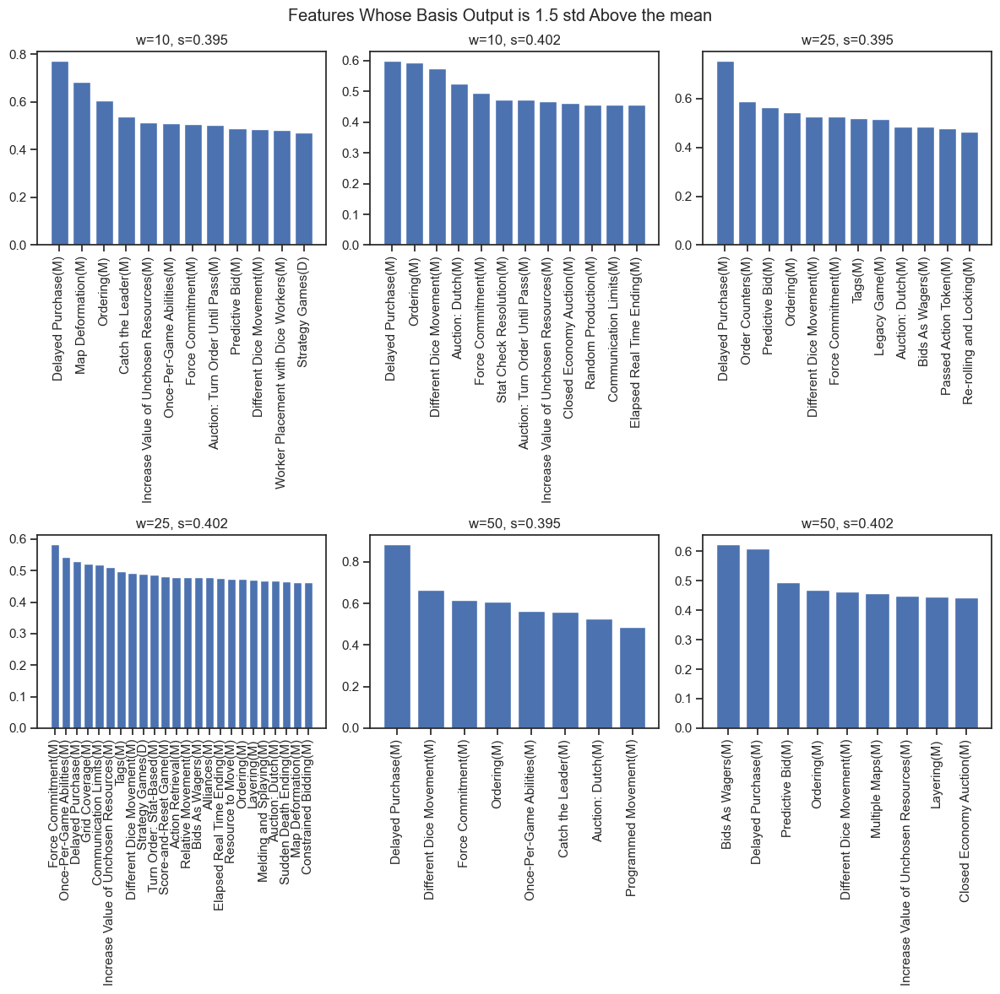

In [88]:
## Create the subplots
fig, axs = plt.subplots(2, 3, figsize=(12, 12))

## Loop over all the hyper parameters
for idx,(w,s) in enumerate(hyper_params):
    ## Initialize the current NN and comput the mean and standard deviation
    curr_NN_outputs = basis_outputs_df['w={}, s={:.3f}'.format(w,s)]
    curr_NN_outputs_mean = np.mean(curr_NN_outputs)
    curr_NN_outputs_std = np.std(curr_NN_outputs)

    ## Obtain the top outputs and save them to a global object for future use
    top_curr_NN_outputs = curr_NN_outputs[curr_NN_outputs > curr_NN_outputs_mean + 1.5*curr_NN_outputs_std].sort_values(ascending=False)
    globals()['top_NN_w={}_s={:.3f}'.format(w,s)] = top_curr_NN_outputs

    ## Plot the values
    ax = axs[idx//3, idx%3]
    x_ticks = np.arange(len(top_curr_NN_outputs))  
    ax.bar(x_ticks, top_curr_NN_outputs)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(cols[2+top_curr_NN_outputs.index], rotation=90)
    ax.set_title('w={}, s={:.3f}'.format(w,s))
    

plt.suptitle('Features Whose Basis Output is 1.5 std Above the mean')
plt.tight_layout()
plt.show()

We see that each model favours fairly different features. In fact the only one that is in common amongst all of them is 'Delayed Purchase'.

In [89]:
common_top_features = top_base_outputs.index

for w,s in hyper_params:
    curr_top_features = globals()['top_NN_w={}_s={:.3f}'.format(w,s)].index
    common_top_features = common_top_features.intersection(curr_top_features)

cols[2+common_top_features]
    

Index(['Delayed Purchase(M)', 'Different Dice Movement(M)'], dtype='object')

We would ideally like to find some features that, idealy, work for all the models to better convince ourselves that we have indeed found a game that would be highly rated. Therefore, let us average the outputs and perform the same analysis.

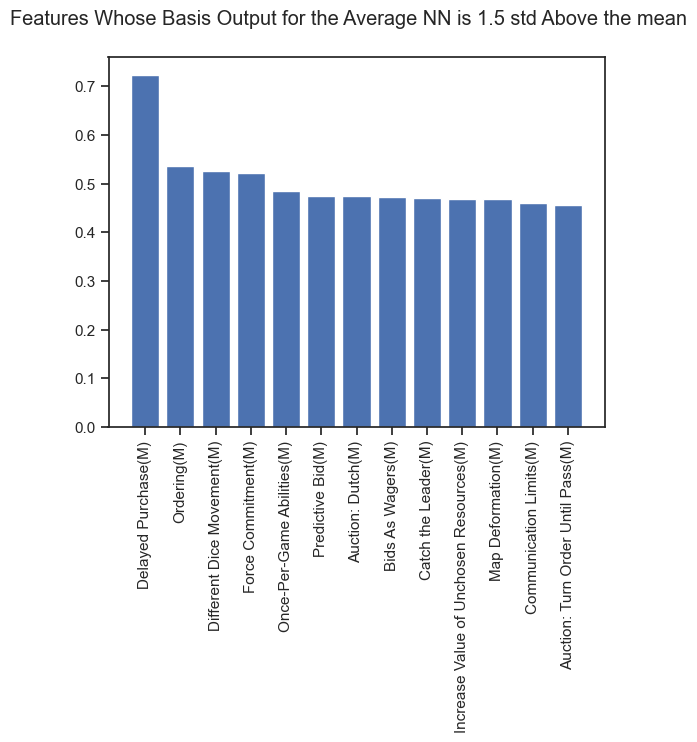

In [90]:
average_output = basis_outputs_df.drop(columns=['Feature']).mean(axis=1)

average_output_mean = average_output.mean()
average_output_std = average_output.std()

top_average_output = average_output[average_output > average_output_mean + 1.5*average_output_std].sort_values(ascending=False)

## Plot the bar graph
plt.bar(cols[2+top_average_output.index],top_average_output)
plt.xticks(rotation=90)
plt.suptitle('Features Whose Basis Output for the Average NN is 1.5 std Above the mean')
plt.show()

We now hopw that these features, when combined, would create a game that each model predicts to be highly rated. However, it seems hard to test this as all we have now is mechanics. Let us investigate further the other types of features.

##### Attributes

We plot the same bar graphs but for the attribute features.

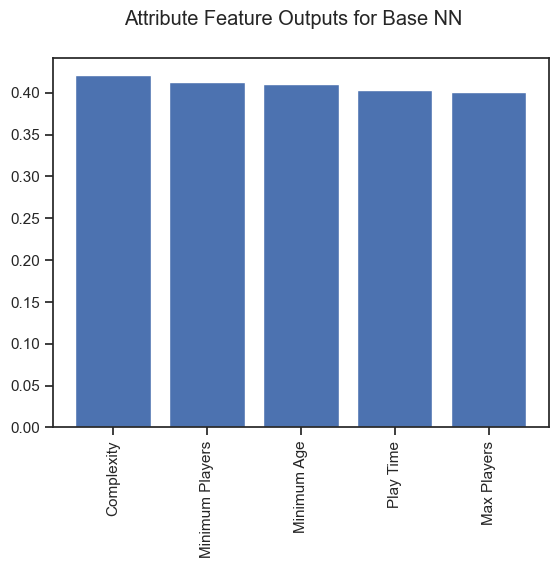

In [91]:
## Obtain the attribute features of the base column and order them
base_attribute_outputs = basis_outputs_df['Base'][:5]
ordered_base_attribute_outputs = base_attribute_outputs.sort_values(ascending=False)

## Plot the bar graph
plt.bar(cols[2+ordered_base_attribute_outputs.index],ordered_base_attribute_outputs)
plt.xticks(rotation=90)
plt.suptitle('Attribute Feature Outputs for Base NN')
plt.show()



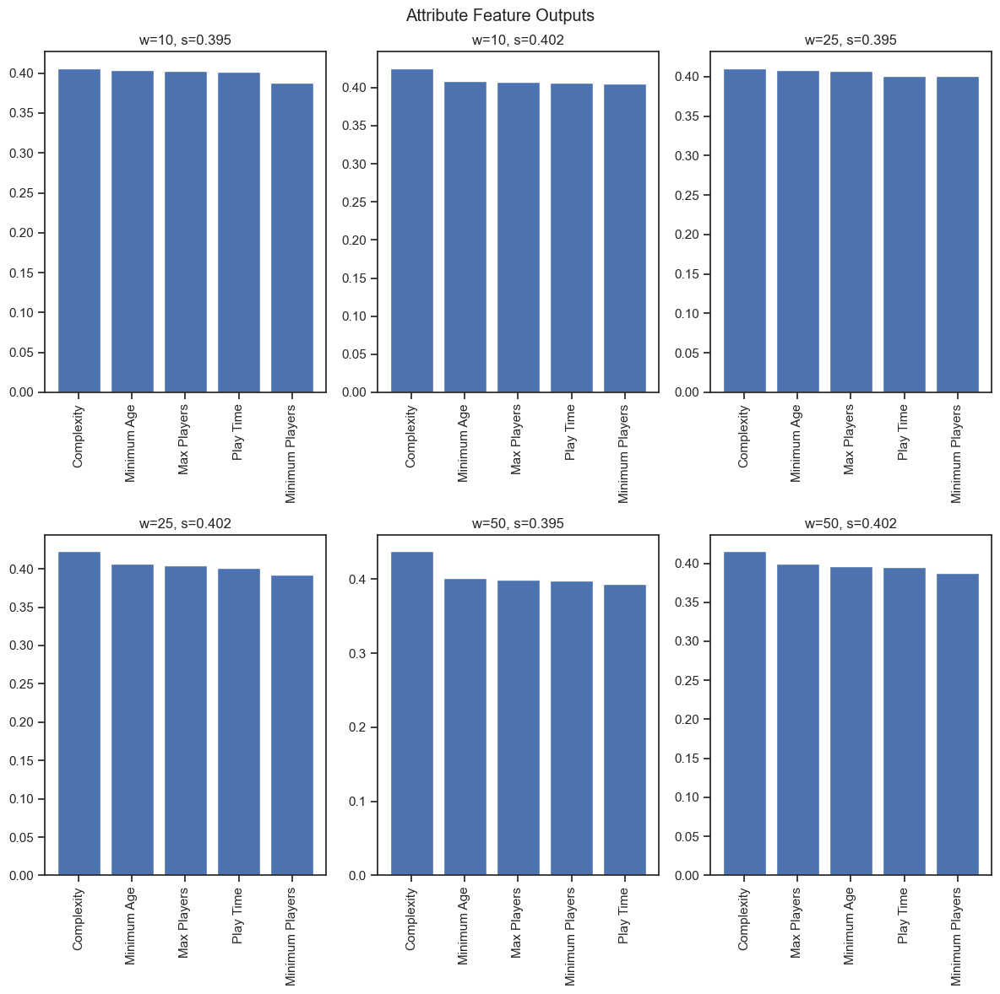

In [92]:
## Create the subplots
fig, axs = plt.subplots(2, 3, figsize=(12, 12))

## Loop over all the hyper parameters
for idx,(w,s) in enumerate(hyper_params):
    ## Obtain the attribute features of the current NN column and order them
    curr_NN_attributes_outputs = basis_outputs_df['w={}, s={:.3f}'.format(w,s)][:5]
    ordered_curr_NN_attributes_outputs = curr_NN_attributes_outputs.sort_values(ascending=False)

    ## Save the ordered features for future use
    globals()['ordered_NN_w={}_s={:.3f}_attribute'.format(w,s)] = ordered_curr_NN_attributes_outputs 

    ## Plot the values
    ax = axs[idx//3, idx%3]
    x_ticks = np.arange(len(ordered_curr_NN_attributes_outputs))  
    ax.bar(x_ticks, ordered_curr_NN_attributes_outputs)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(cols[2+ordered_curr_NN_attributes_outputs.index], rotation=90)
    ax.set_title('w={}, s={:.3f}'.format(w,s))
    

plt.suptitle('Attribute Feature Outputs')
plt.tight_layout()
plt.show()

We see now in all cases the expected outputs are relatively similar.

##### Subdomains

We plot the same bar graphs but for the subdomain features.

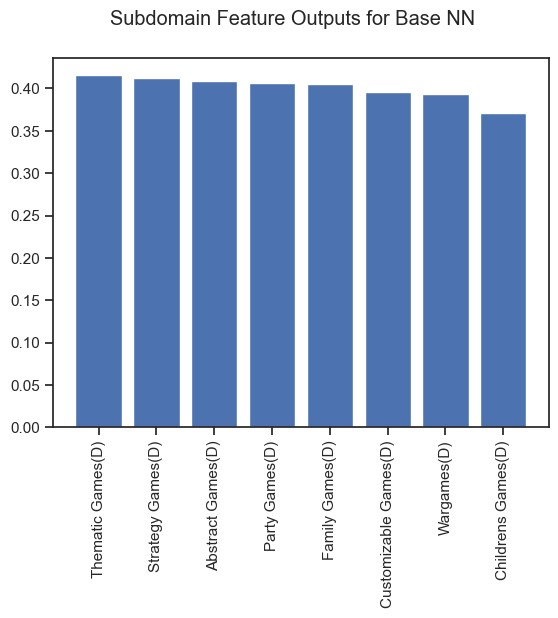

In [93]:
## Obtain the subdomain features of the base column and order them
base_subdomain_outputs = basis_outputs_df['Base'][5:13]
ordered_base_subdomain_outputs = base_subdomain_outputs.sort_values(ascending=False)

## Plot the bar graph
plt.bar(cols[2+ordered_base_subdomain_outputs.index],ordered_base_subdomain_outputs)
plt.xticks(rotation=90)
plt.suptitle('Subdomain Feature Outputs for Base NN')
plt.show()

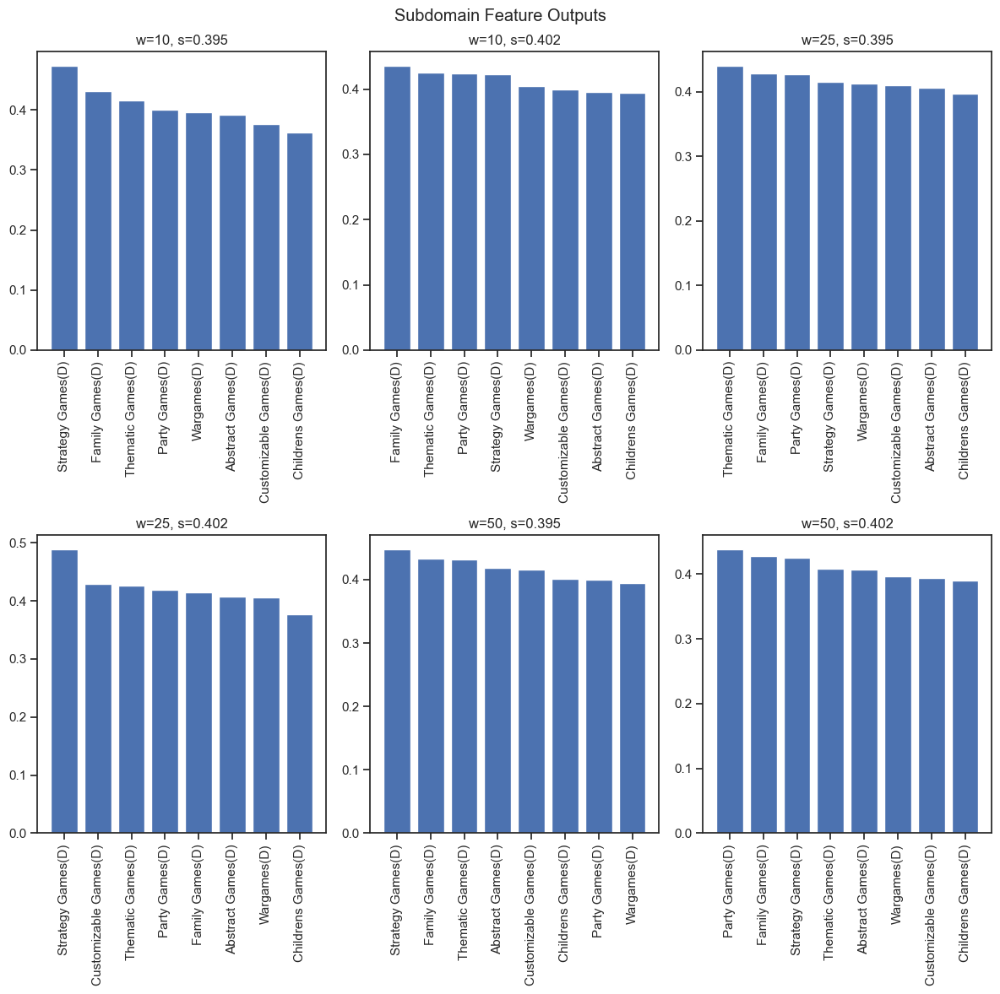

In [94]:
## Create the subplots
fig, axs = plt.subplots(2, 3, figsize=(12, 12))

## Loop over all the hyper parameters
for idx,(w,s) in enumerate(hyper_params):
    ## Obtain the subdomain features of the current NN column and order them
    curr_NN_subdomain_outputs = basis_outputs_df['w={}, s={:.3f}'.format(w,s)][5:13]
    ordered_curr_NN_subdomain_outputs = curr_NN_subdomain_outputs.sort_values(ascending=False)

    ## Save the ordered features for future use
    globals()['ordered_NN_w={}_s={:.3f}_subdomain'.format(w,s)] = ordered_curr_NN_subdomain_outputs 

    ## Plot the values
    ax = axs[idx//3, idx%3]
    x_ticks = np.arange(len(ordered_curr_NN_subdomain_outputs))  
    ax.bar(x_ticks, ordered_curr_NN_subdomain_outputs)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(cols[2+ordered_curr_NN_subdomain_outputs.index], rotation=90)
    ax.set_title('w={}, s={:.3f}'.format(w,s))
    

plt.suptitle('Subdomain Feature Outputs')
plt.tight_layout()
plt.show()

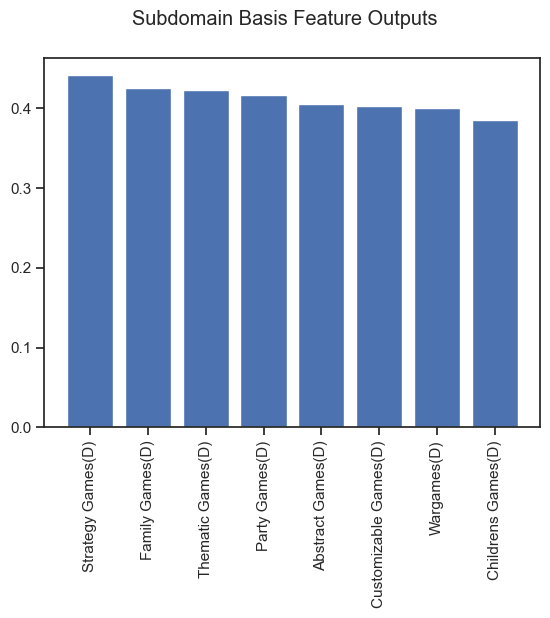

In [95]:
average_subdomain_output = basis_outputs_df.drop(columns=['Feature']).mean(axis=1)[5:13]

ordered_average_subdomain_output = average_subdomain_output.sort_values(ascending=False)

## Plot the bar graph
plt.bar(cols[2+ordered_average_subdomain_output.index],ordered_average_subdomain_output)
plt.xticks(rotation=90)
plt.suptitle('Subdomain Basis Feature Outputs')
plt.show()

##### Categories

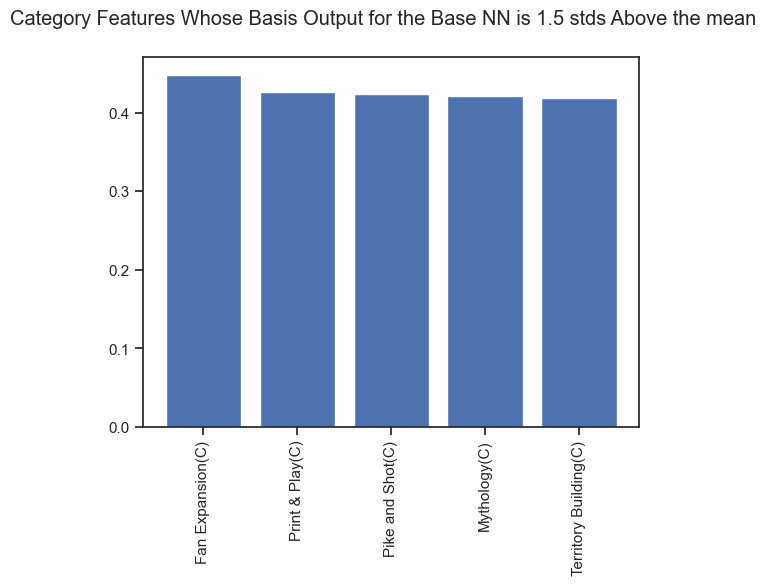

In [96]:
## Obtain the category features of the base column and compute the mean and std
base_category_outputs = basis_outputs_df['Base'][13:96]
base_category_outputs_mean = np.mean(base_category_outputs)
base_category_outputs_std = np.std(base_category_outputs)

## Obtain the outputs that are one std above the mean
top_base_category_outputs = base_category_outputs[base_category_outputs > base_category_outputs_mean + 1.5*base_category_outputs_std].sort_values(ascending=False)

## Plot the bar graph
plt.bar(cols[2+top_base_category_outputs.index],top_base_category_outputs)
plt.xticks(rotation=90)
plt.suptitle('Category Features Whose Basis Output for the Base NN is 1.5 stds Above the mean')
plt.show()

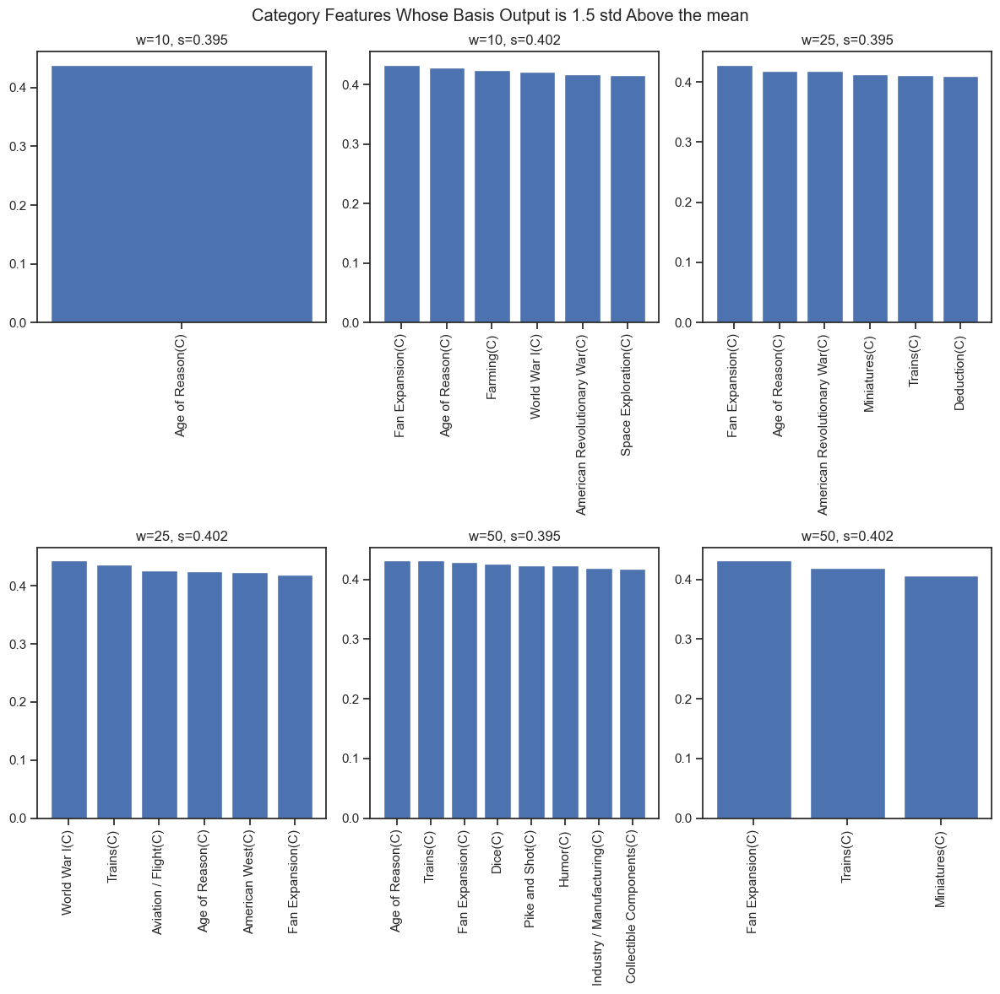

In [97]:
## Create the subplots
fig, axs = plt.subplots(2, 3, figsize=(12, 12))

## Loop over all the hyper parameters
for idx,(w,s) in enumerate(hyper_params):
    ## Initialize the current NN and comput the mean and standard deviation
    curr_NN_category_outputs = basis_outputs_df['w={}, s={:.3f}'.format(w,s)][13:96]
    curr_NN_category_outputs_mean = np.mean(curr_NN_category_outputs)
    curr_NN_category_outputs_std = np.std(curr_NN_category_outputs)

    ## Obtain the top outputs and save them to a global object for future use
    top_curr_NN_category_outputs = curr_NN_category_outputs[curr_NN_category_outputs > curr_NN_category_outputs_mean + 1.5*curr_NN_category_outputs_std].sort_values(ascending=False)
    globals()['top_NN_w={}_s={:.3f}'.format(w,s)] = top_curr_NN_outputs

    ## Plot the values
    ax = axs[idx//3, idx%3]
    x_ticks = np.arange(len(top_curr_NN_category_outputs))  
    ax.bar(x_ticks, top_curr_NN_category_outputs)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(cols[2+top_curr_NN_category_outputs.index], rotation=90)
    ax.set_title('w={}, s={:.3f}'.format(w,s))
    

plt.suptitle('Category Features Whose Basis Output is 1.5 std Above the mean')
plt.tight_layout()
plt.show()

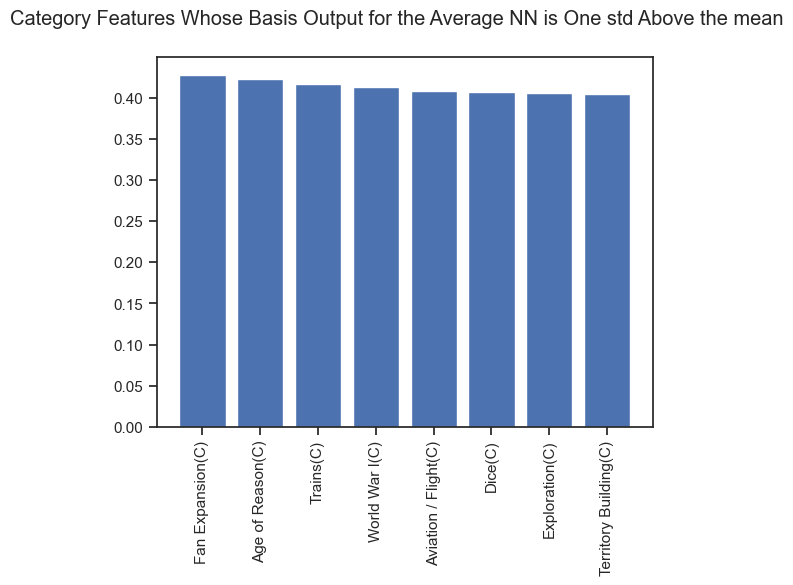

In [98]:
average_category_output = basis_outputs_df.drop(columns=['Feature']).mean(axis=1)[13:96]

average_category_output_mean = average_category_output.mean()
average_category_output_std = average_category_output.std()

top_average_category_output = average_category_output[average_category_output > average_category_output_mean + 1*average_category_output_std].sort_values(ascending=False)

## Plot the bar graph
plt.bar(cols[2+top_average_category_output.index],top_average_category_output)
plt.xticks(rotation=90)
plt.suptitle('Category Features Whose Basis Output for the Average NN is One std Above the mean')
plt.show()

##### Mechanics

As the features we found when considering all the features were all of Mechanic type, doing the analysis specifically for Mechanic type features would result in the same graphs so we do not do it here.

#### Generating Games

Now that we know which features appear to be the most important for a high rating, we can combine them to create features of a game.

We want to generate a random set of attributes that we expect to be highly rated. As none of our models have produced concrete ways of selecting these attributes, we will use the graph generated in the Data Inspection and Visualization section. Namely we will randomly generate a game whose:

- Complexiy is between 0.4 and 0.6
- Minimum Age is between 0.5 and 0.7
- Minimum Players is between 0.01 and 0.1
- Maximum Players is between 0.3 and 0.5
- Play time is between 0.5 and 0.7

Moreover, since these are normalized values, we should return them to their raw numbers.

In [99]:
print('Complexity is between', 0.4*(max_complexity-min_complexity) + min_complexity, 'and', 0.6*(max_complexity-min_complexity) + min_complexity)
print('Minimum Age is between', 0.5*(max_min_age-min_min_age) + min_min_age, 'and', 0.7*(max_min_age-min_min_age) + min_min_age)
print('Minimum Players is between', 0.01*(max_min_players-min_min_players) + min_min_players, 'and', 0.1*(max_min_players-min_min_players) + min_min_players)
print('Maximum Players is between', 0.3*(max_max_players-min_max_players) + min_max_players, 'and', 0.5*(max_max_players-min_max_players) + min_max_players)
print('Play Time is between', 0.3*(max_play_time-min_play_time) + min_play_time, 'and', 0.6*(max_play_time-min_play_time) + min_play_time)


Complexity is between 2.6 and 3.4
Minimum Age is between 10.5 and 14.7
Minimum Players is between 1.09 and 1.9
Maximum Players is between 3.6999999999999997 and 5.5
Play Time is between 54.699999999999996 and 108.39999999999999


In [100]:
def get_rand_attributes():
    rand_complex = random.uniform(0.4, 0.6)
    rand_min_age = random.uniform(0.5,0.7)
    rand_min_player  = random.uniform(0.01,0.1)
    rand_max_player = random.uniform(0.3,0.5)
    rand_play_time = random.uniform(0.3,0.6)

    return np.concatenate([[rand_complex,rand_min_age,rand_min_player,rand_max_player,rand_play_time], np.zeros(282)])

The top four Subdomains we found were 
- Strategry Games
- Family Games
- Thematic Games
- Party Games

According to the linear models 3 of these also seem to be positive correlated. Therefore, we will generate random subsets of these Subdomains as the subdomains of our game.

In [101]:
def get_rand_subdomains():
    
    ## Obtain the relevant subdomain indices
    subdomain_indices = ordered_average_subdomain_output[:4].index.to_numpy()

    ## Generate the size of a random subset
    subset_size = np.random.randint(0, len(subdomain_indices) + 1)

    ## Is the subset size is 0, return the 0 array
    if subset_size == 0:
        return np.zeros(287)
    
    ## Generate a random subset of the subset size
    random_subset = np.random.choice(subdomain_indices, size=subset_size, replace=False)

    ## Return the one-hot encoded array for the subset divided by the subset size
    return np.array([1/subset_size if i in random_subset else 0 for i in range(287)])


The top Categories on average we found were
- Fan Expansion
- Age of Reason
- Trains
- World War I
- Aviation/Flight
- Dice
- Exploration
- Territory Building



We will generate random subsets of these Categories as the categories of our game.

In [102]:
def get_rand_categories():
    
    ## Obtain the relevant category indices
    category_indices = top_average_category_output.index.to_numpy()

    ## Generate the size of a random subset
    subset_size = np.random.randint(0, len(category_indices) + 1)

    ## Is the subset size is 0, return the 0 array
    if subset_size == 0:
        return np.zeros(287)
    
    ## Generate a random subset of the subset size
    random_subset = np.random.choice(category_indices, size=subset_size, replace=False)

    ## Return the one-hot encoded array for the subset divided by the subset size
    return np.array([1/subset_size if i in random_subset else 0 for i in range(287)])

The top Mechanics on average we found were
- Delayed Purchase
- Ordering
- Different Dice Movement
- Force Commitment
- Once-Per-Game Abilities
- Predictive Bid
- Auction: Dutch
- Bids As Wagers
- Catch the Leader
- Increase Value of Unchosen Resources
- Map Deformation
- Communication Limits
- Auction: Turn Order Until Pass

We will generate random subsets of these Mechanics as the mechanics of our game.

In [103]:
def get_rand_mechanics():
    
    ## Obtain the relevant category indices
    mechanic_indices = top_average_output.index.to_numpy()

    ## Generate the size of a random subset
    subset_size = np.random.randint(0, len(mechanic_indices) + 1)

    ## Is the subset size is 0, return the 0 array
    if subset_size == 0:
        return np.zeros(287)
    
    ## Generate a random subset of the subset size
    random_subset = np.random.choice(mechanic_indices, size=subset_size, replace=False)

    ## Return the one-hot encoded array for the subset divided by the subset size
    return np.array([1/subset_size if i in random_subset else 0 for i in range(287)])

Finally we combine them all together to create our function that generates a random game.

In [104]:
def get_rand_games(n):

    generated_games = pd.DataFrame(columns=cols[2:])

    for idx in range(n):

        attributes = get_rand_attributes()
        subdomains = get_rand_subdomains()
        categories = get_rand_categories()
        mechanics = get_rand_mechanics()

        rand_game = attributes + subdomains + categories + mechanics

        generated_games.loc[idx] = rand_game

    return generated_games

#### Test Generated Games

Now that we can generate games, let us test to see if out model actually does predict these games are good.

In [105]:
generated_games = get_rand_games(50)

base_pred = NN_base.predict(generated_games,verbose=False).squeeze()

generated_games_with_ratings = generated_games.copy()
generated_games_with_ratings.insert(0, 'Base', base_pred)

for idx, (w,s) in enumerate(hyper_params):

    curr_NN = globals()['NN_w={}_s={:.3f}'.format(w,s)]
    curr_pred = curr_NN.predict(generated_games,verbose=False).squeeze()

    generated_games_with_ratings.insert(idx+1, 'w={}, s={:.3f}'.format(w,s), curr_pred)

generated_games_with_ratings

,Base,"w=10, s=0.395","w=10, s=0.402","w=25, s=0.395","w=25, s=0.402","w=50, s=0.395","w=50, s=0.402",Complexity,Minimum Age,Minimum Players,...,Turn Order: Time Track(M),Variable Phase Order(M),Variable Player Powers(M),Variable Set-up(M),Victory Points as a Resource(M),Voting(M),"Worker Placement, Different Worker Types(M)",Worker Placement with Dice Workers(M),Worker Placement(M),Zone of Control(M)
0,0.860781,0.781311,0.842733,0.854770,0.775359,0.802263,0.811894,0.460005,0.640165,0.041586,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.683700,0.692071,0.685624,0.570111,0.732432,0.620810,0.731643,0.537131,0.597402,0.067798,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.599735,0.512755,0.671183,0.497719,0.521466,0.657645,0.486968,0.426027,0.598334,0.087488,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.435528,0.426400,0.428890,0.421679,0.433941,0.426400,0.404074,0.422241,0.545077,0.070596,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.832087,0.798814,0.813939,0.792790,0.763434,0.783276,0.814811,0.429134,0.608300,0.031374,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.881442,0.841107,0.806027,0.825585,0.816463,0.821070,0.823598,0.537705,0.656748,0.098743,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.671963,0.634009,0.609845,0.514827,0.694981,0.603840,0.651983,0.457954,0.676294,0.019507,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.722755,0.835102,0.750760,0.607441,0.879106,0.773427,0.813311,0.511014,0.572213,0.084307,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.901575,0.737916,0.852455,0.795187,0.733054,0.798178,0.753030,0.469009,0.603046,0.010174,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.748431,0.780428,0.754427,0.665420,0.797405,0.740907,0.751745,0.535075,0.503929,0.050313,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


So you can see that the models all tend to agree on the relative range of the rating, which gives us confidence on the correctness. Moreover, most of the ratings tend to be higher than 0.7, which equates to a game in 400. Furthermore, none of the games recieve a predicted rating below 0.4, which is still around average.

c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\bgames\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

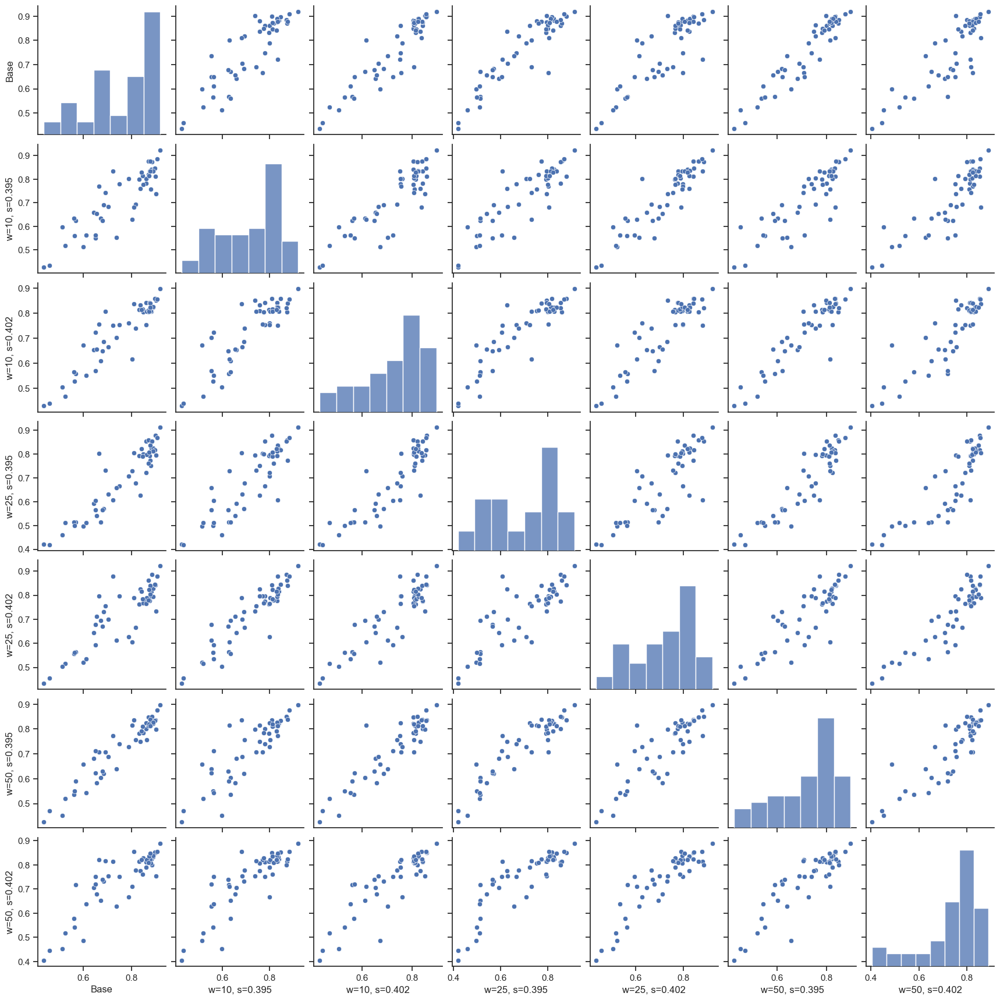

In [106]:
generated_game_ratings = generated_games_with_ratings.iloc[:,:7]

sns.set(style="ticks")
mechanic_scatterplot = sns.pairplot(generated_game_ratings)
plt.show()

Indeed, we observe a general positive correlation between the ratings and that in most cases the models predict mostly in the upper range of the rating scale. 

## 6. Conclusions

We have obtained several models to predict whether a game will have a high rating on board game geek. As the goal was to predict if certain characteristics of a game will result in a highly rating (true positive), we have optimized our models to have high precision and accuracy. 

Looking at the Hyper Paramter Tuning subsection of the Model Training section, we observe that the precision is always roughly around 0.9 while the accuracy is around 0.8, giving us high expectations that a game our model predicts will be highly rated, will indeed be highly rated.

Furthermore, we have used these models to generate features that our model predicts will be highly rated, thus allowing us to focus the planning of a board game to capture these features. These features include:

- A complexity of between 2.6 and 3.4 (out of 5)
- A minimum age between 10 and 14
- The number of players between 2 and 5
- The play time between 50 and 100 minutes
- The DOMAIN of the game consisting of some of:
    - Strategry Games
    - Family Games
    - Thematic Games
    - Party Games
- The CATEGORY of the game consisting of some of:
    - Fan Expansion
    - Age of Reason
    - Trains
    - World War I
    - Aviation/Flight
    - Dice
    - Exploration
    - Territory Building
- The MECHANICS of the game consisting of some of:
    - Delayed Purchase
    - Ordering
    - Different Dice Movement
    - Force Commitment
    - Once-Per-Game Abilities
    - Predictive Bid
    - Auction: Dutch
    - Bids As Wagers
    - Catch the Leader
    - Increase Value of Unchosen Resources
    - Map Deformation
    - Communication Limits
    - Auction: Turn Order Until Pass



For example, as the code below shows, the base Neural Network model predicts a game with complexity 2.5, with a minimum age of 10, number of players between 2 and 5 and play time of 1 hour that is a Strategy game using Trains and Territory Building with Delayed Purchase, Predictive Bid, Map Deformation and Communication Limits mechanics would have a rating of 7.87, which would make it in the top 100 highest rated games listed on boardgamegeek.com. 

In [107]:
## Normalize the attributes
game_complexity = (2.5-min_complexity)/(max_complexity-min_complexity)
game_min_age = (10-min_min_age)/(max_min_age-min_min_age)
game_min_players = (2-min_min_players)/(max_min_players-min_min_players)
game_max_players = (5-min_max_players)/(max_max_players-min_max_players)
game_play_time = (60-min_play_time)/(max_play_time-min_play_time)

## Collect them into an attribute only array
game_attributes = np.concatenate([[game_complexity,game_min_age,game_min_players,game_max_players,game_play_time], np.zeros(282)])


In [108]:
## Find the index of Strategy Games(D)
strategy_game_index = cols.to_list().index('Strategy Games(D)')-2

## Create the domain only array
game_domains = np.array([1.0 if i == strategy_game_index else 0 for i in range(287)])

In [109]:
## Find the index of Trains(C) and City Building(C)
train_index = cols.to_list().index('Trains(C)')-2
city_building_index = cols.to_list().index('Territory Building(C)')-2

## Create the category only array
category_indices = [train_index,city_building_index]
game_categories = np.array([0.5 if i in category_indices else 0 for i in range(287)])

In [110]:
## Find the index of Delayed Purchase(M), Map Deformation(M), Relative Movement(M) and Communication Limits(M)
del_pur_index = cols.to_list().index('Delayed Purchase(M)')-2
map_def_index = cols.to_list().index('Predictive Bid(M)')-2
rel_move_index = cols.to_list().index('Map Deformation(M)')-2
comm_lim_index = cols.to_list().index('Communication Limits(M)')-2

## Create the category only array
mechanics_indices = [del_pur_index,map_def_index,rel_move_index,comm_lim_index]
game_mechanics = np.array([0.25 if i in mechanics_indices else 0 for i in range(287)])

In [111]:
game = game_attributes + game_domains + game_categories + game_mechanics

NN_base_output = NN_base.predict(np.array([game]))[0][0]

predicted_rating = NN_base_output*(max_rating-min_rating) + min_rating
predicted_rating


1/1 [==============================] - 0s 84ms/step


7.8746697894048685